## **Problem Statement**
# Forecast Gold Prices
### Business Objective:
#### Data provided is related to gold prices. The objective is to understand the underlying structure in your dataset and come up with a suitable forecasting model which can effectively forecast gold prices for next 30 days.
#### This forecast model will be used by gold exporting and gold importing companies to understand the metal price movements and accordingly set their revenue expectations.


## 1. Introduction:<a class="anchor" id="1"></a>
### What is Forecasting a Time Series?
Time series forecasting is one of the most applied data science techniques in business, finance, supply chain management, production and inventory planning. Many prediction problems involve a time component and thus require extrapolation of time series data, or time series forecasting. Time series forecasting is also an important area of machine learning (ML) and can be cast as a supervised learning problem. ML methods such as Regression, Neural Networks, Support Vector Machines, Random Forests and XGBoost — can be applied to it. Forecasting involves taking models fit on historical data and using them to predict future observations.

Time series forecasting means to forecast or to predict the future value over a period of time. It entails developing models based on previous data and applying them to make observations and guide future strategic decisions.

The future is forecast or estimated based on what has already happened. Time series adds a time order dependence between observations. This dependence is both a constraint and a structure that provides a source of additional information. Before we discuss time series forecasting methods, let’s define time series forecasting more closely.

Time series forecasting is a technique for the prediction of events through a sequence of time. It predicts future events by analyzing the trends of the past, on the assumption that future trends will hold similar to historical trends. It is used across many fields of study in various applications including:

+ Astronomy
+ Business planning
+ Control engineering
+ Earthquake prediction
+ Econometrics
+ Mathematical finance
+ Pattern recognition
+ Resources allocation
+ Signal processing
+ Statistics
+ Weather forecasting

Time series forecasting starts with a historical time series. Analysts examine the historical data and check for patterns of time decomposition, such as trends, seasonal patterns, cyclic patterns and regularity. Many areas within organizations including marketing, finance and sales use some form of time series forecasting to evaluate probable technical costs and consumer demand. Models for time series data can have many forms and represent different stochastic processes.




In [1]:
# Importing Libraries
import numpy as np
import pandas as pd
from scipy.stats import boxcox
from pandas.plotting import lag_plot
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.stattools import acf, pacf
from statsmodels.graphics.tsaplots import plot_acf
from statsmodels.graphics.tsaplots import plot_pacf
from pandas import DataFrame
from pandas import Grouper
from math import sqrt
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_squared_error
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.holtwinters import SimpleExpSmoothing # SES
from statsmodels.tsa.holtwinters import Holt # Holts Exponential Smoothing
from statsmodels.tsa.holtwinters import ExponentialSmoothing
import matplotlib.pyplot as plt
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import seaborn as sns
from collections import Counter
sns.set_style('darkgrid')
from dataprep.eda import plot, plot_correlation, plot_missing, create_report
import plotly.express as px
from plotly.offline import plot as off
import plotly.figure_factory as ff
import plotly.io as pio
from sklearn.preprocessing import StandardScaler, LabelEncoder, MinMaxScaler, scale
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import GridSearchCV, KFold, StratifiedKFold, cross_val_score, \
                                    train_test_split, RandomizedSearchCV
import warnings
warnings.filterwarnings('ignore')
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import mutual_info_regression

In [2]:
# Import Dataset
df = pd.read_csv('Gold_data.csv')
print('Shape of the data',df.shape)
df.head(10)

Shape of the data (2182, 2)


,date,price
0,2016-01-01,2252.60
1,2016-01-02,2454.50
2,2016-01-03,2708.10
3,2016-01-04,2577.80
4,2016-01-05,2597.75
5,2016-01-06,2617.70
6,2016-01-07,2903.80
7,2016-01-08,2887.80
8,2016-01-09,2813.80
9,2016-01-10,2786.80


## 3. Data Exploration


Before doing anything else with the data let's see if there are any null values (missing data) in any of the columns.

In [3]:
df.isnull().any()

date     False
price    False
dtype: bool

In [4]:
df.isnull().sum()

date     0
price    0
dtype: int64

<AxesSubplot:>

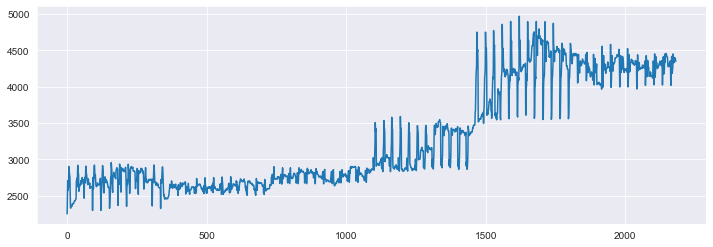

In [5]:
df.price.plot(figsize=(12,4))

- We have no missing data so all the entries are valid for use.

- Now we can check the column names to get a better understanding of what features we will be basing our regression on.

### 3.1 Descriptive Analysis

In [6]:
df.shape

(2182, 2)

In [7]:
#Checking the data types
df.dtypes

date      object
price    float64
dtype: object

In [8]:
#Unique values for every feature
df.nunique()

date     2182
price    1876
dtype: int64

In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2182 entries, 0 to 2181
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   date    2182 non-null   object 
 1   price   2182 non-null   float64
dtypes: float64(1), object(1)
memory usage: 34.2+ KB


In [10]:
df.date= pd.to_datetime(df.date)

In [11]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2182 entries, 0 to 2181
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   date    2182 non-null   datetime64[ns]
 1   price   2182 non-null   float64       
dtypes: datetime64[ns](1), float64(1)
memory usage: 34.2 KB


In [12]:
df[df.duplicated()].shape

(0, 2)

In [13]:
df[df.duplicated()]

,date,price


In [14]:
df.describe()

,price
count,2182.000000
mean,3284.450046
std,719.564434
min,2252.600000
25%,2697.020000
50%,2879.800000
75%,4147.325000
max,4966.300000


### Feature Engineering

#### Making the Date as DateTime index for the Dataframe

In [15]:
df1 = df.copy()
df1.set_index('date',inplace=True)
df1.index.year

Int64Index([2016, 2016, 2016, 2016, 2016, 2016, 2016, 2016, 2016, 2016,
            ...
            2021, 2021, 2021, 2021, 2021, 2021, 2021, 2021, 2021, 2021],
           dtype='int64', name='date', length=2182)

In [16]:
df1.head()

,price
date,
2016-01-01,2252.60
2016-01-02,2454.50
2016-01-03,2708.10
2016-01-04,2577.80
2016-01-05,2597.75


#### Separating Month and Year into Separate Column for Visualization and removing meaningful insight of the data

In [17]:
df["date"] = pd.to_datetime(df.date,format="%b-%y")
df["month"] = df.date.dt.strftime("%b") # month extraction
df["year"] = df.date.dt.strftime("%Y") # year extraction
df.head(10)

,date,price,month,year
0,2016-01-01,2252.60,Jan,2016
1,2016-01-02,2454.50,Jan,2016
2,2016-01-03,2708.10,Jan,2016
3,2016-01-04,2577.80,Jan,2016
4,2016-01-05,2597.75,Jan,2016
5,2016-01-06,2617.70,Jan,2016
6,2016-01-07,2903.80,Jan,2016
7,2016-01-08,2887.80,Jan,2016
8,2016-01-09,2813.80,Jan,2016
9,2016-01-10,2786.80,Jan,2016


### Data Visualization

<AxesSubplot:xlabel='month', ylabel='year'>

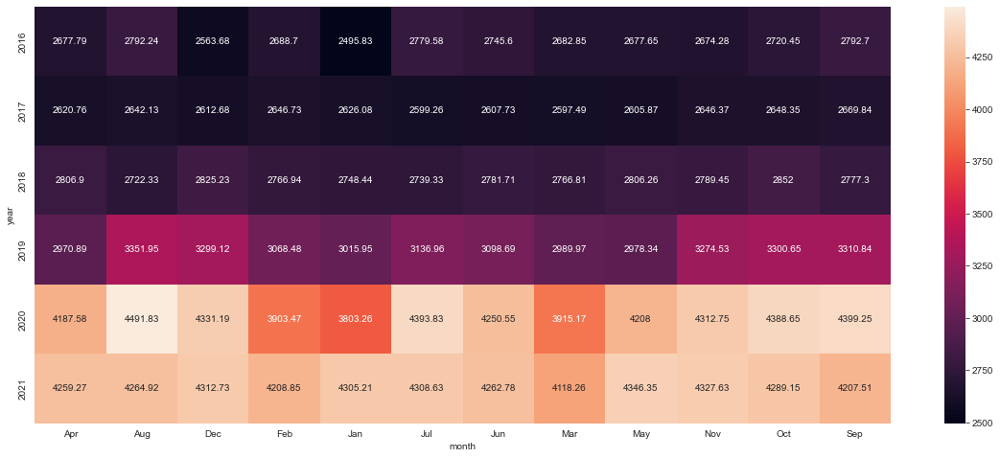

In [18]:
plt.figure(figsize=(20,8))
heatmap_y_month = pd.pivot_table(data=df,values="price",index="year",columns="month",aggfunc="mean",fill_value=0)
sns.heatmap(heatmap_y_month,annot=True,fmt="g") #fmt is format of the grid values

In [19]:
heatmap_y_month

month,Apr,Aug,Dec,Feb,Jan,Jul,Jun,Mar,May,Nov,Oct,Sep
year,,,,,,,,,,,,
2016,2677.790000,2792.240323,2563.683333,2688.703448,2495.832258,2779.582258,2745.596667,2682.854839,2677.650000,2674.280000,2720.454839,2792.705000
2017,2620.758333,2642.133871,2612.683871,2646.730357,2626.077957,2599.256452,2607.733333,2597.485484,2605.872581,2646.371667,2648.345161,2669.835000
2018,2806.903333,2722.327419,2825.232258,2766.942857,2748.438710,2739.325806,2781.715000,2766.806452,2806.258065,2789.446667,2851.996774,2777.303333
2019,2970.890000,3351.954839,3299.116129,3068.482143,3015.954839,3136.961290,3098.686667,2989.967742,2978.335484,3274.526667,3300.645161,3310.843333
2020,4187.580000,4491.829032,4331.187097,3903.472414,3803.264516,4393.832258,4250.550000,3915.170968,4208.000000,4312.750000,4388.651613,4399.250000
2021,4259.273333,4264.919355,4312.733333,4208.853571,4305.209677,4308.632258,4262.783333,4118.264516,4346.348387,4327.633333,4289.148387,4207.506667


#### Line plot

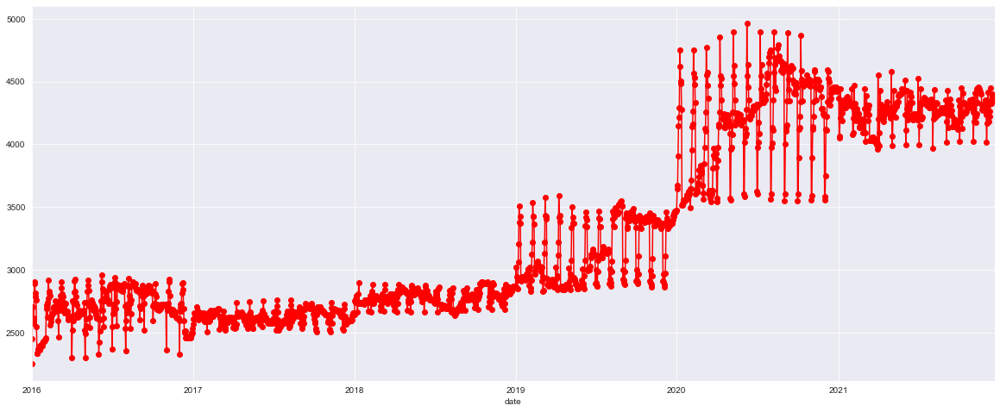

In [20]:
df1['price'].plot(figsize=(20, 8),color='red',marker='o')
plt.show()

##### Observation: 
1. We can see that there is an increasing Trend. So, Trend is not constant.
2. Variance is also not constant.

Hence the time serise is not stationary.

Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.


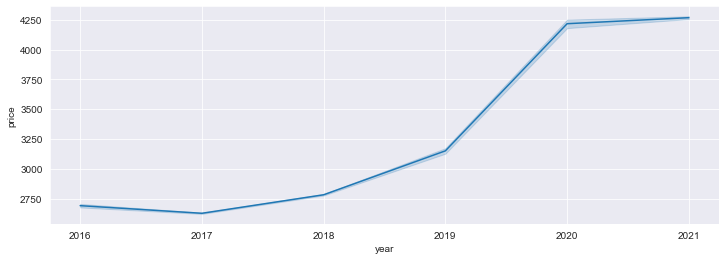

In [21]:
plt.figure(figsize=(12,4))
sns.lineplot(x="year",y="price",data=df)
warnings.filterwarnings('ignore')

#### Box Plot of Each Year by Monthly Intervals

<AxesSubplot:xlabel='year', ylabel='price'>

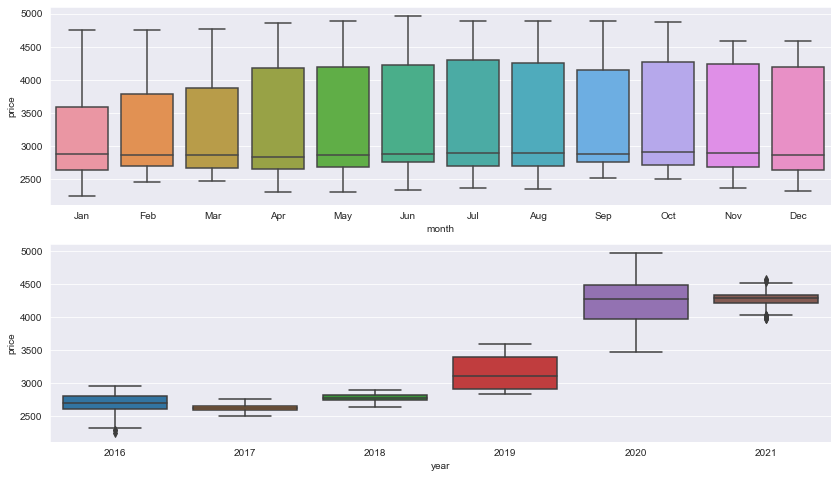

In [22]:
# Boxplot for ever
plt.figure(figsize=(14,8))
plt.subplot(211)
sns.boxplot(x="month",y="price",data=df)
plt.subplot(212)
sns.boxplot(x="year",y="price",data=df)

#### Histogram and Density Plots

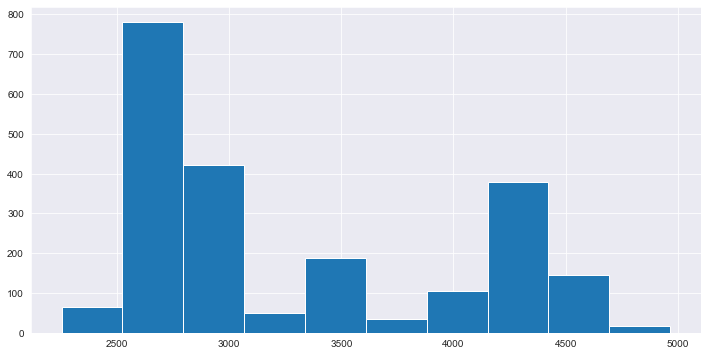

In [23]:
df.price.hist(figsize=(12,6))
plt.show()

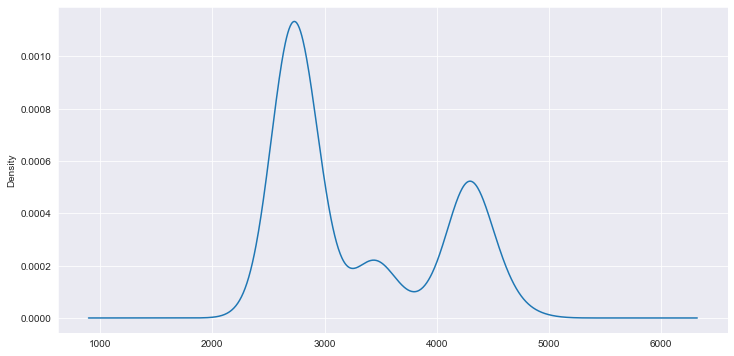

In [24]:
# create a density plot
df.price.plot(kind='kde', figsize=(12,6))
plt.show()

#### Lag plot

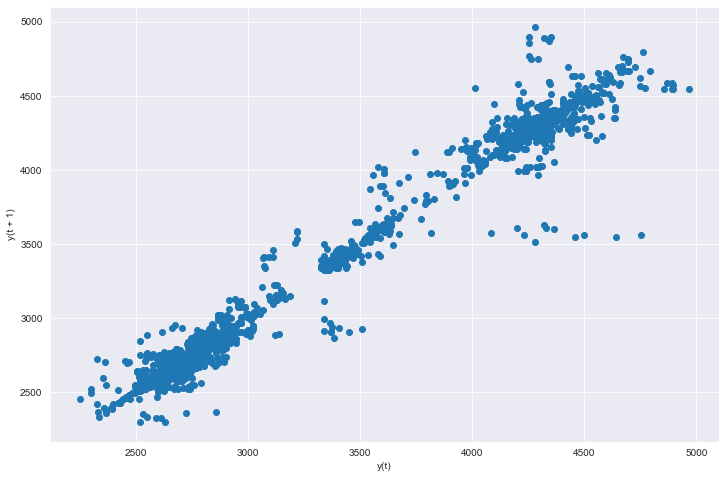

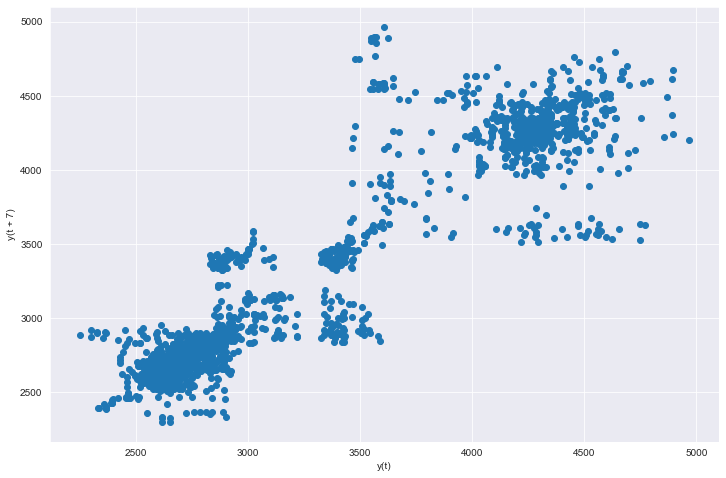

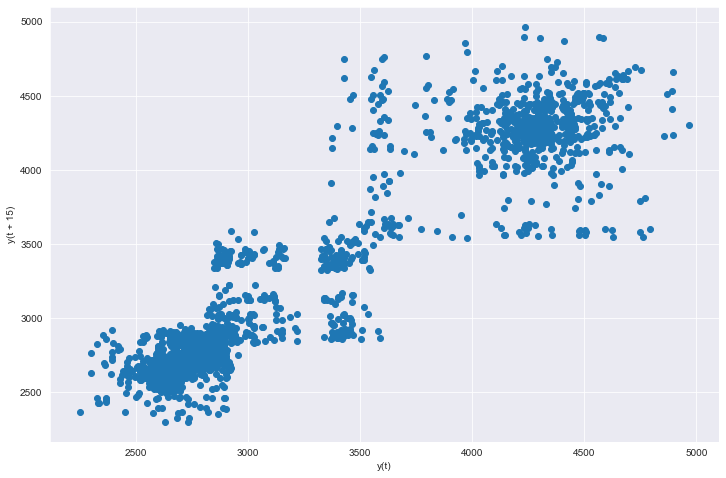

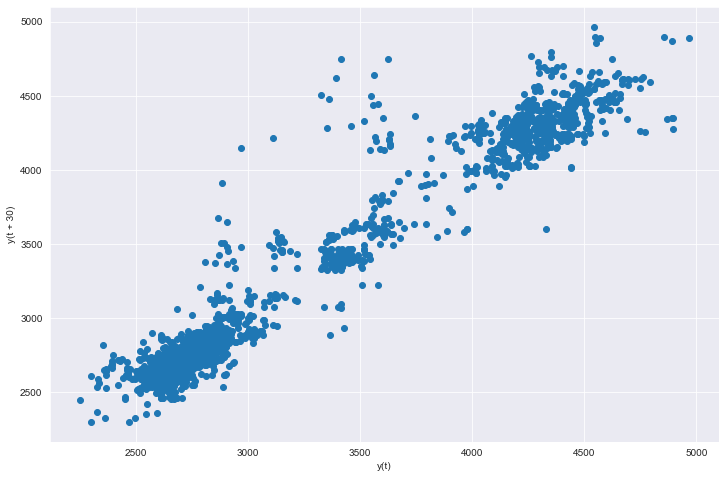

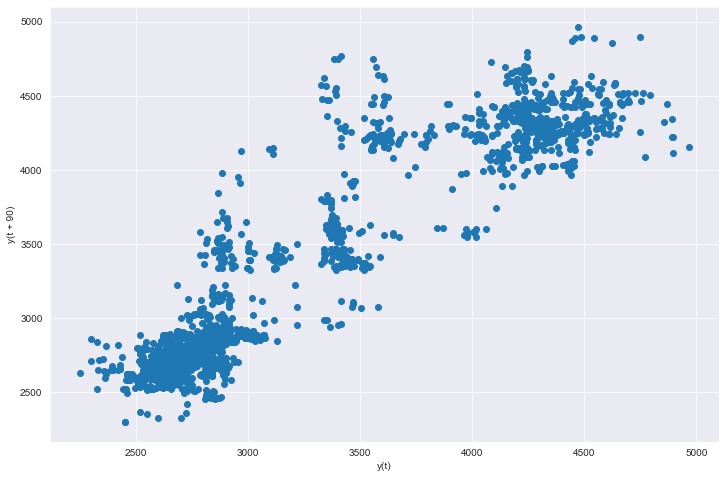

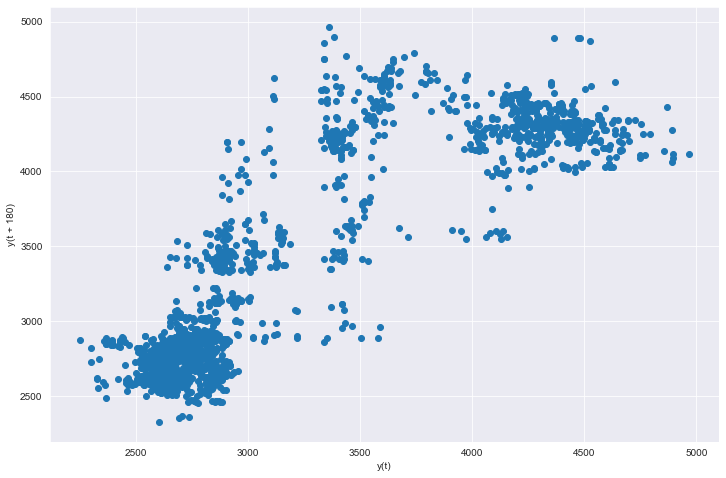

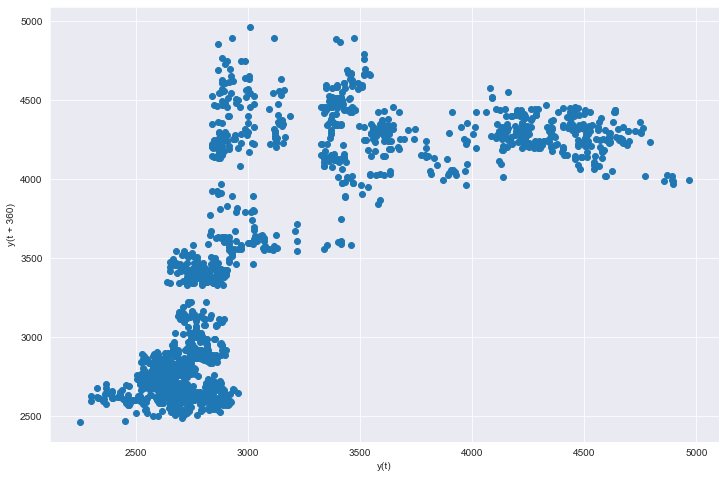

In [25]:
  
# create a scatter plot
for i in [1, 7, 15, 30, 90, 180, 360]:
    plt.figure(figsize=(12,8))
    lag_plot(df.price, lag=i)
    plt.show()

### Moving Average

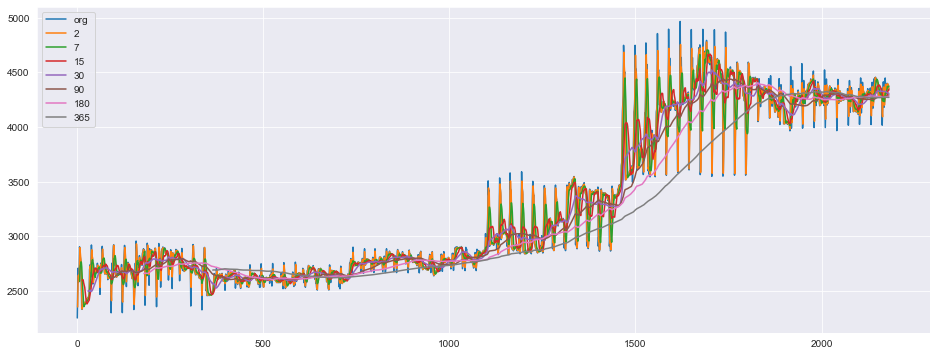

In [26]:
plt.figure(figsize=(16,6))
df.price.plot(label="org")
lis=[2,7,15,30,90,180,365]

for i in lis:
    df["price"].rolling(i).mean().plot(label=str(i))
plt.legend(loc='best')

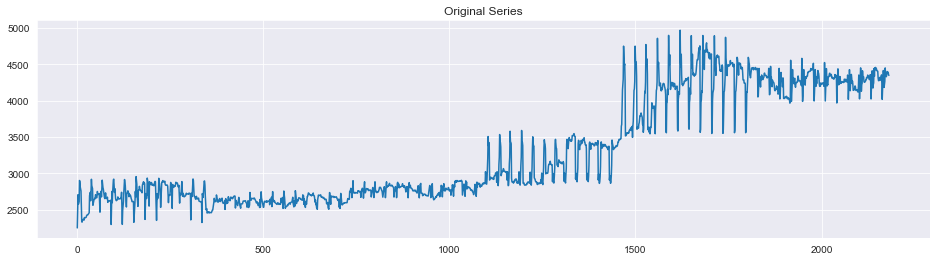

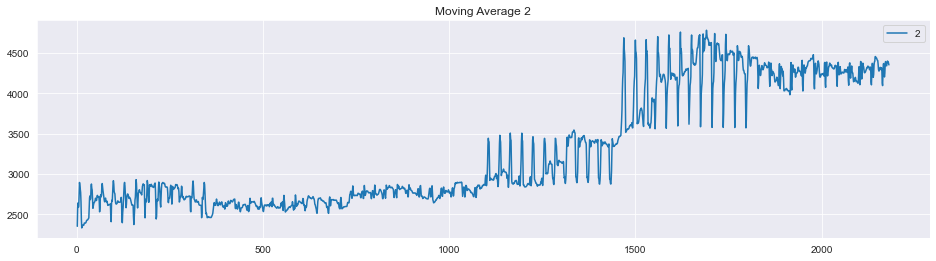

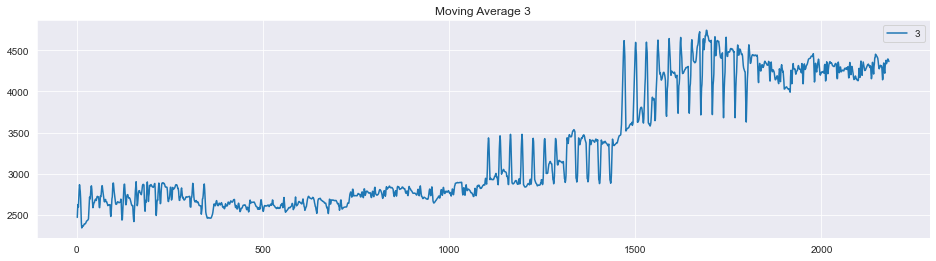

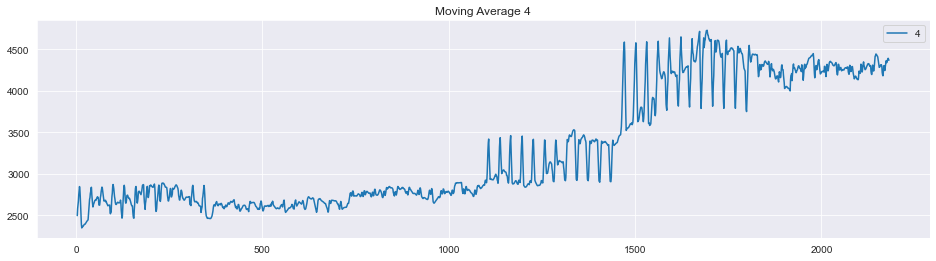

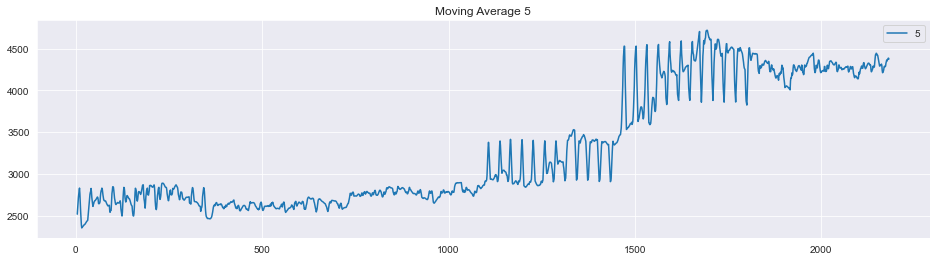

...

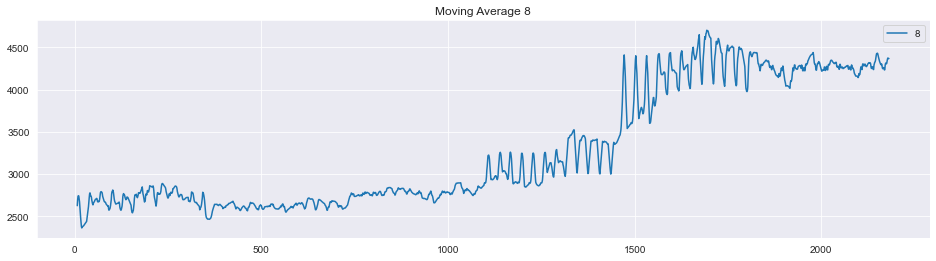

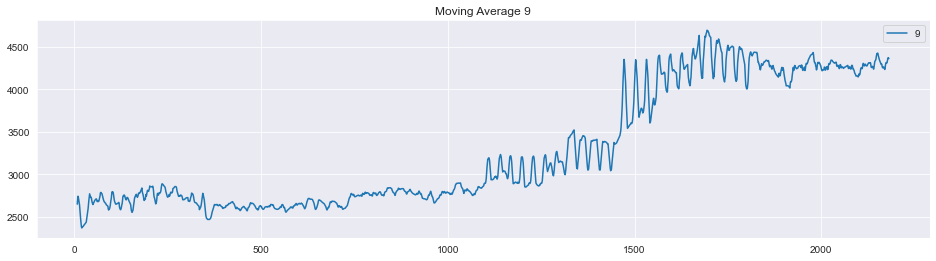

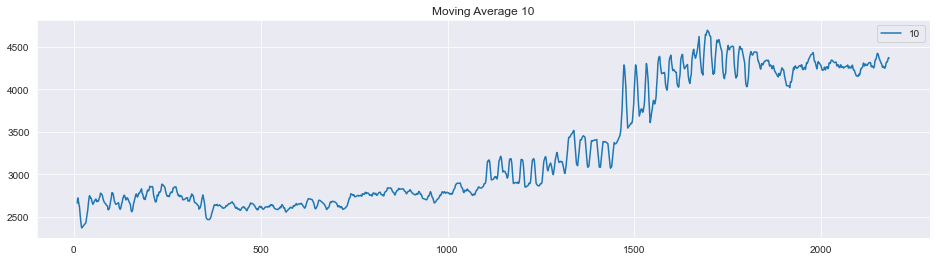

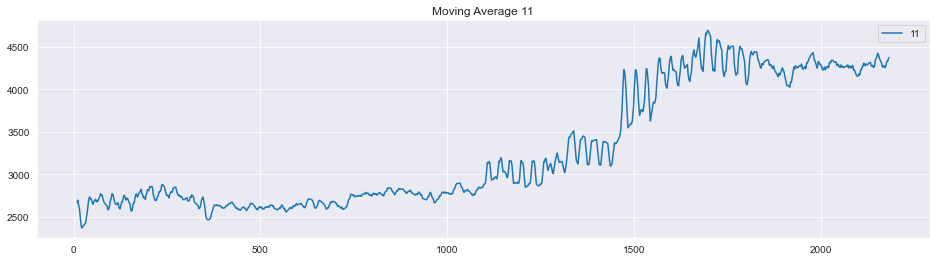

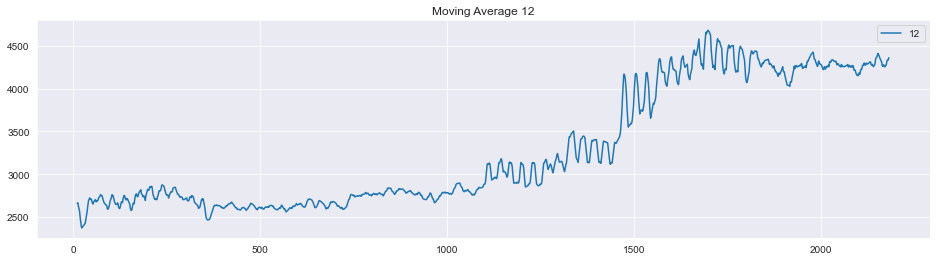

In [27]:
plt.figure(figsize=(16,4))
df.price.plot(label="org")
plt.title("Original Series")
for i in range(2,13):
    plt.figure(figsize=(16,4))
    df["price"].rolling(i).mean().plot(label=str(i))
    plt.title("Moving Average "+str(i))
    plt.legend(loc='best')
    plt.show()

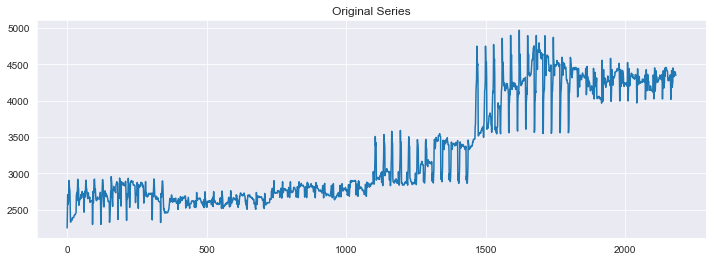

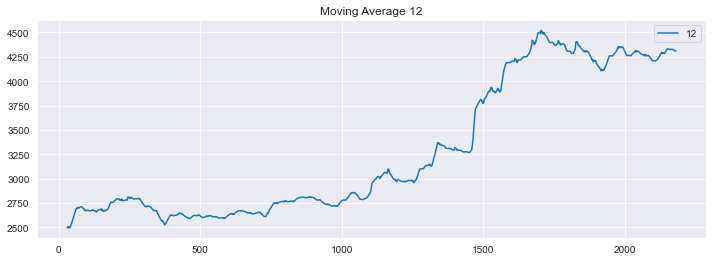

In [28]:
plt.figure(figsize=(12,4))
df.price.plot(label="org")
plt.title("Original Series")
plt.figure(figsize=(12,4))
df["price"].rolling(30).mean().plot(label=str(12))
plt.title("Moving Average "+str(12))
plt.legend(loc='best')
plt.show()

In [29]:
df

,date,price,month,year
0,2016-01-01,2252.60,Jan,2016
1,2016-01-02,2454.50,Jan,2016
2,2016-01-03,2708.10,Jan,2016
3,2016-01-04,2577.80,Jan,2016
4,2016-01-05,2597.75,Jan,2016
...,...,...,...,...
2177,2021-12-17,4394.40,Dec,2021
2178,2021-12-18,4389.50,Dec,2021
2179,2021-12-19,4389.50,Dec,2021
2180,2021-12-20,4354.10,Dec,2021


### Time series decomposition plot 

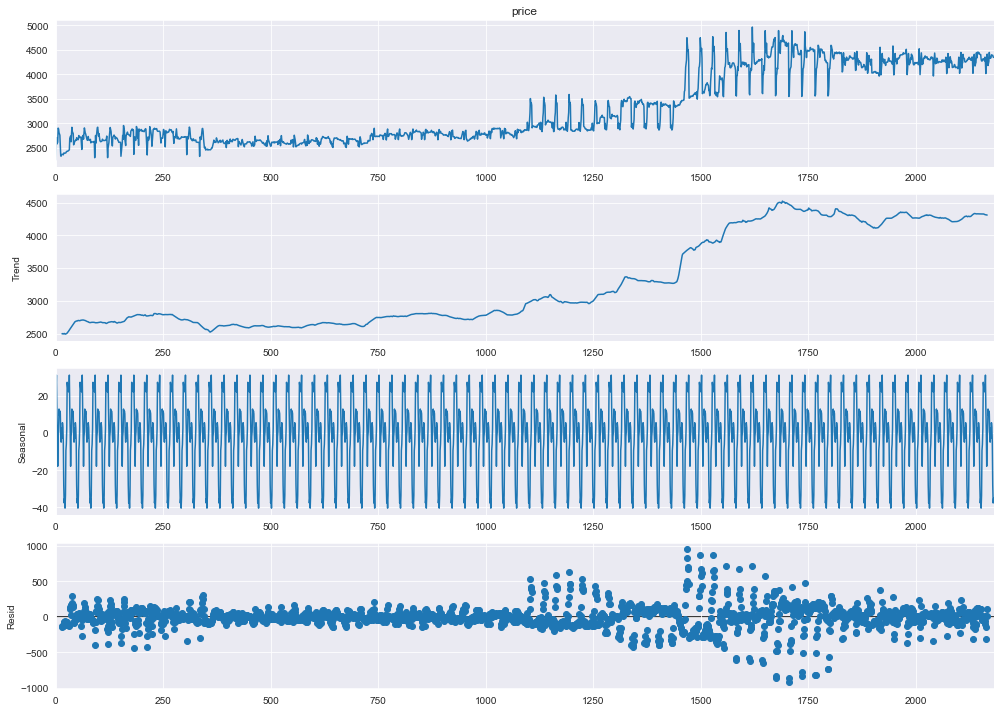

In [30]:
decompose_ts_add = seasonal_decompose(df.price,period=30)
with plt.rc_context():
    plt.rc("figure", figsize=(14,10))
    decompose_ts_add.plot()
    plt.show()

#### Autocorrelation Function (ACF)
The autocorrelation function (ACF) is a statistical technique that we can use to identify how correlated the values in a time series are with each other. The ACF plots the correlation coefficient against the lag, which is measured in terms of a number of periods or units. A lag corresponds to a certain point in time after which we observe the first value in the time series.

The correlation coefficient can range from -1 (a perfect negative relationship) to +1 (a perfect positive relationship). A coefficient of 0 means that there is no relationship between the variables. Also, most often, it is measured either by Pearson’s correlation coefficient or by Spearman’s rank correlation coefficient.

It’s most often used to analyze sequences of numbers from random processes, such as economic or scientific measurements. It can also be used to detect systematic patterns in correlated data sets such as securities prices or climate measurements. Usually, we can calculate the ACF using statistical packages from Python and R or using software such as Excel and SPSS. Below, we can see an example of the ACF plot:

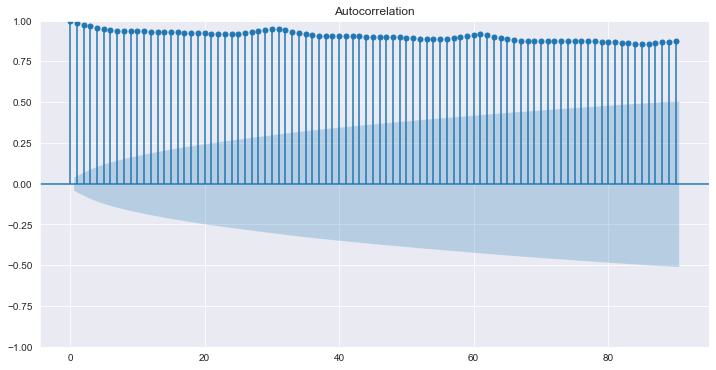

In [31]:
import statsmodels.graphics.tsaplots as tsa_plots
with plt.rc_context():
    plt.rc("figure", figsize=(12,6))
    tsa_plots.plot_acf(df.price,lags=90)
    plt.show()

#### Partial Autocorrelation Function (PACF)
Partial autocorrelation is a statistical measure that captures the correlation between two variables after controlling for the effects of other variables. For example, if we’re regressing a signal S at lag t (S_{t}) with the same signal at lags t-1, t-2 and t-3 (S_{t-1}, S_{t-2}, S_{t-3}), the partial correlation between S_{t} and S_{t-3} is the amount of correlation between S_{t} and S_{t-3} that isn’t explained by their mutual correlations with S_{t-1} and S_{t-2}.

That being said, the way of finding PACF between S_{t} and S_{t-3} is to use regression model

(1) \begin{align*} S_{t} = \phi_{1}S_{t-1} + \phi_{2}S_{t-2} + \phi_{3}S_{t-3} + \epsilon \end{align*}

where  \phi_{1}, \phi_{2} and \phi_{3} are coefficients and \epsilon is error. From the regression formula above, the PACF value between S_{t} and S_{t-3} is the coefficient \pi_{3}. This coefficient will give us direct effect of time-series S_{t-3} to the time-series S_{t} because the effects of S_{t-2} and S_{t-1} are already captured by \phi_{1} and \phi_{2}.

The figure below presents the PACF plot:

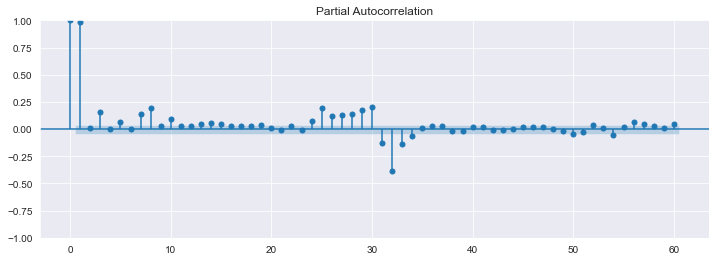

In [32]:
import statsmodels.graphics.tsaplots as tsa_plots
with plt.rc_context():
    plt.rc("figure", figsize=(12,4))
    tsa_plots.plot_pacf(df.price,lags=60)
    plt.show()

#### To summarize, a partial autocorrelation function captures a “direct” correlation between time series and a lagged version of itself.

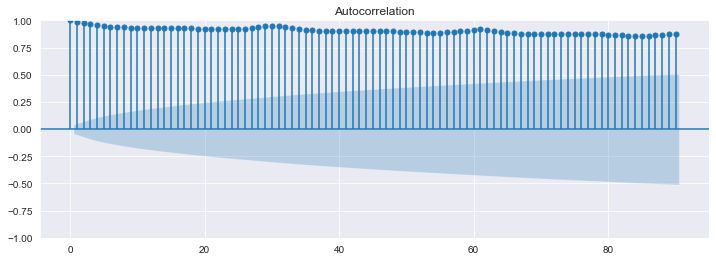

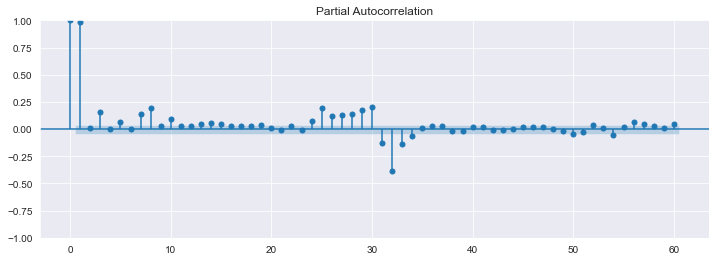

In [33]:
import statsmodels.graphics.tsaplots as tsa_plots
with plt.rc_context():
    plt.rc("figure", figsize=(12,4))
    tsa_plots.plot_acf(df.price,lags=90)
    tsa_plots.plot_pacf(df.price,lags=60)
    plt.show()

In [34]:
visual = df1.copy()
visual.reset_index(inplace=True)
visual['date'] = pd.to_datetime(visual['date'])
visual['year'] = visual['date'].dt.year
visual['month'] = visual['date'].dt.month
visual['week'] = visual['date'].dt.isocalendar().week
visual['quarter'] = visual['date'].dt.quarter
visual['day_of_week'] = visual['date'].dt.day_name()
#visual.drop('date', axis =1 , inplace= True)
visual.head(10)

,date,price,year,month,week,quarter,day_of_week
0,2016-01-01,2252.60,2016,1,53,1,Friday
1,2016-01-02,2454.50,2016,1,53,1,Saturday
2,2016-01-03,2708.10,2016,1,53,1,Sunday
3,2016-01-04,2577.80,2016,1,1,1,Monday
4,2016-01-05,2597.75,2016,1,1,1,Tuesday
5,2016-01-06,2617.70,2016,1,1,1,Wednesday
6,2016-01-07,2903.80,2016,1,1,1,Thursday
7,2016-01-08,2887.80,2016,1,1,1,Friday
8,2016-01-09,2813.80,2016,1,1,1,Saturday
9,2016-01-10,2786.80,2016,1,1,1,Sunday


In [35]:
visual.year.unique()

array([2016, 2017, 2018, 2019, 2020, 2021], dtype=int64)

1) Seasonality
Seasonality is a simple term that means while predicting a time series data there are some months in a particular domain where the output value is at a peak as compared to other months. for example if you observe the data of tours and travels companies of past 3 years then you can see that in November and December the distribution will be very high due to holiday season and festival season. So while forecasting time series data we need to capture this seasonality.

2) Trend
The trend is also one of the important factors which describe that there is certainly increasing or decreasing trend time series, which actually means the value of organization or sales over a period of time and seasonality is increasing or decreasing.

#### Additive Seasonal Decomposition

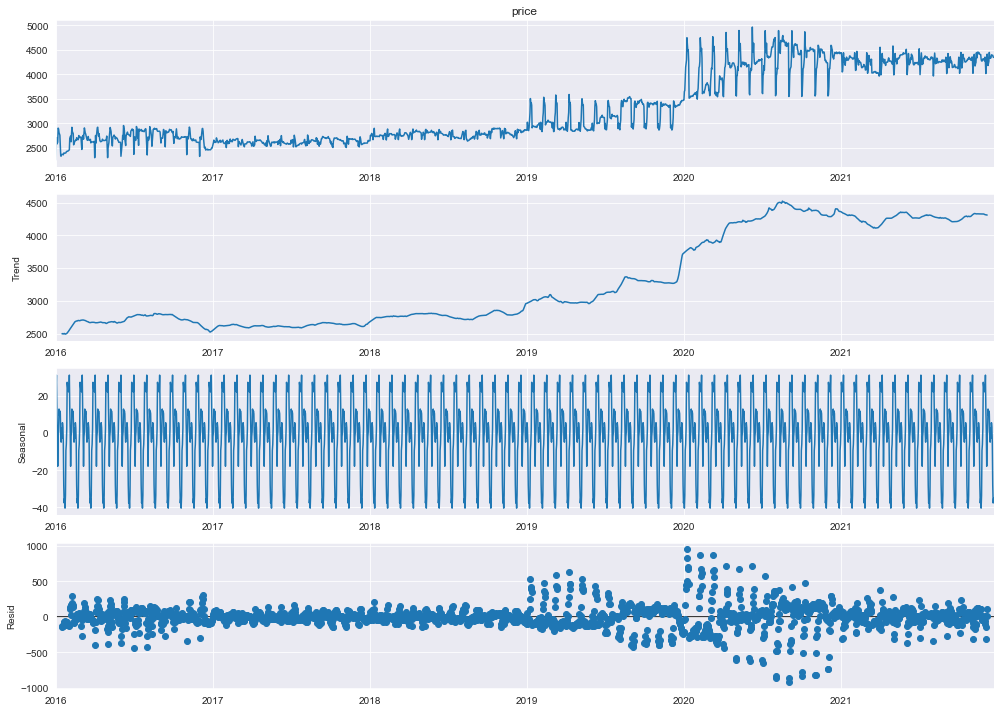

In [36]:
decompose_ts_add = seasonal_decompose(df1.price,period=30, model='additive')
with plt.rc_context():
    plt.rc("figure", figsize=(14,10))
    decompose_ts_add.plot()
    plt.show()

#### Observation:-
1. ***Observed*** - Actual data
2. ***Trend*** - Increasing trend.
3. ***Seasonal*** - 
    - Varies from +40 to -30 with the mean 0. 
    - Each cycle represents each month trend.
    - The value in the Y-axis has to be `added` to the Trend plot value to get the actual value of that year. E.g.:- For the year 1950 Nov, the seasonal value is +50 and the trend value is 100. Hence, teh actual value(passengers number) will (seasonal+Trend) value = 50+100 = 150.
4. ***Residual*** - It is the noise pattern of the time series data for each month, which was not captured by the two components - Trend and Seasonality. Residual is the left over after decomposition of the two major components (Trend and Seasonality)

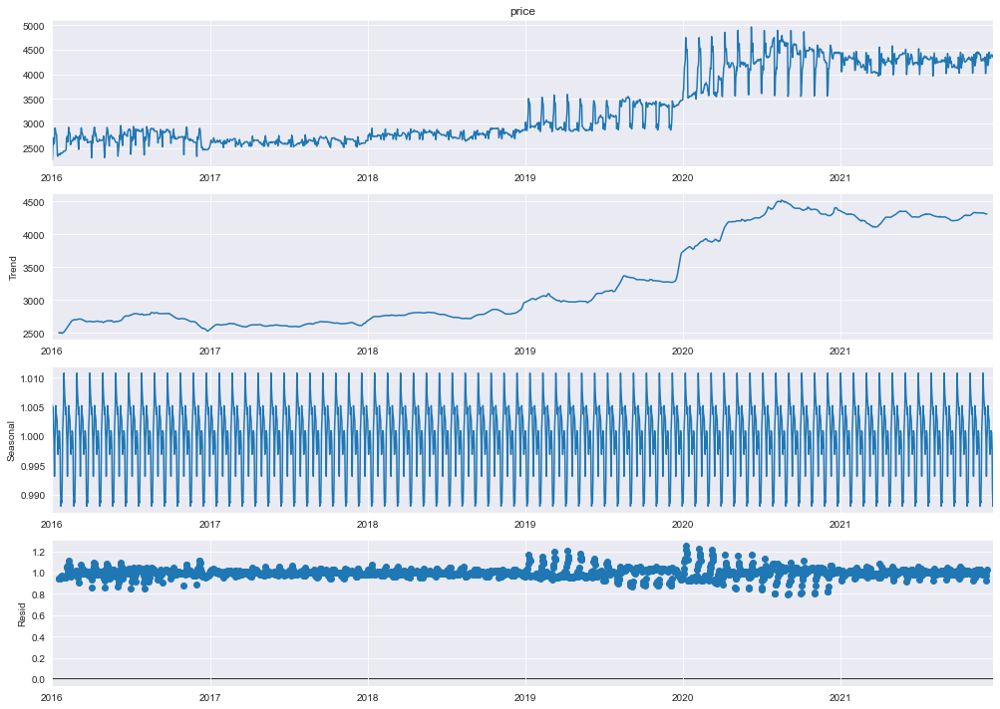

In [37]:
decompose_ts_add = seasonal_decompose(df1.price,period=30, model='multiplicative')
with plt.rc_context():
    plt.rc("figure", figsize=(14,10))
    decompose_ts_add.plot()
    plt.show()

#### Observation:-

***Seasonal*** - 
1. Varies from 0.985 to 1.1 
2. The value in the Y-axis has to be `multiplied` to the Trend plot value to get the actual value of that year. E.g.:- For the year 1950 Nov, the seasonal value is `1.2` and the trend value is `100`. Hence, the actual value(passengers number) will (seasonal X Trend) value = 1.2 X 100 = 120.


### Splitting Train and Test Data
#### Leaving Test Data with 2 months of Time Series

In [38]:
size = -31
train_data = df1[:size]
test_data = df1[size:]

In [39]:
train_data.shape,test_data.shape

((2151, 1), (31, 1))

In [40]:
print('Train:',train_data.index.min(),train_data.index.max(),'\n',
'Test:',test_data.index.min(),test_data.index.max())

Train: 2016-01-01 00:00:00 2021-11-20 00:00:00 
 Test: 2021-11-21 00:00:00 2021-12-21 00:00:00


We are going to forecat for the last two months. 

Last 51 (30+21) records 

<AxesSubplot:xlabel='date'>

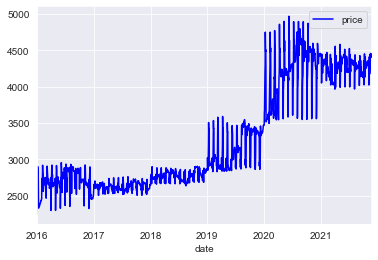

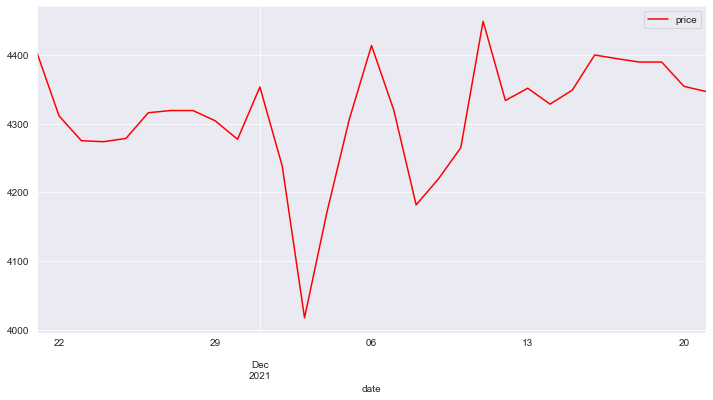

In [41]:
train_data.plot(legend=True,label='TRAIN',color='blue')
test_data.plot(legend=True,label='TEST', figsize=(12,6),color='red')

### Evaluation Metric MAPE

In [42]:
def MAPE(pred,org):
    temp = np.abs((pred-org)/org)*100
    return np.mean(temp)

___
## Exponential Methods
### Simple Exponential Method

#### Using Forecast Attribute

In [43]:
ses_model = SimpleExpSmoothing(train_data['price']).fit(optimized=True)
test_pred_ses = ses_model.forecast(31)
train_pred_ses = ses_model.fittedvalues
test_rmse_ses = sqrt(mean_squared_error(test_pred_ses,test_data.price))
train_rmse_ses = sqrt(mean_squared_error(train_pred_ses,train_data))
mape_ses = MAPE(test_pred_ses,test_data.price)
print('Simple Exponential Method Evaluation',"\n",\
      'Mean Absolute Percent Error = {}'.format(mape_ses),"\n",\
'Train Root Mean Squared Error = {}'.format(train_rmse_ses),"\n",
'Test Root Mean Squared Error = {}'.format(test_rmse_ses))

Simple Exponential Method Evaluation 
 Mean Absolute Percent Error = 2.2794084777964305 
 Train Root Mean Squared Error = 114.27047499364349 
 Test Root Mean Squared Error = 125.37214918408164


### Model Evaluation.

In [44]:
residuals=test_pred_ses-test_data.price

<AxesSubplot:ylabel='Frequency'>

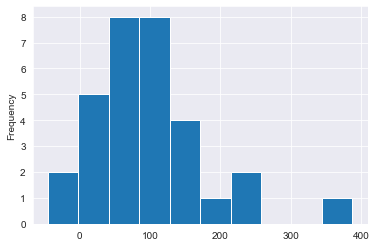

In [45]:
residuals.plot(kind='hist')

<AxesSubplot:ylabel='Density'>

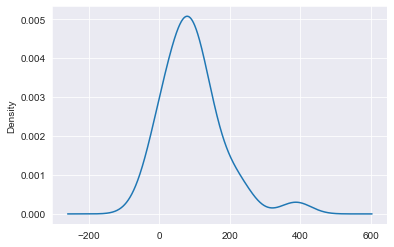

In [46]:
residuals.plot(kind='kde')

In [47]:
residuals.describe()

count     31.000000
mean      93.174204
std       85.271928
min      -44.629022
25%       50.620978
50%       85.370978
75%      128.270978
max      387.170978
dtype: float64

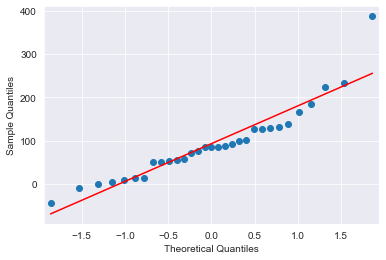

In [48]:
import statsmodels.api as smf
residuals=np.array(residuals)
fig=smf.qqplot(residuals,line='r')
plt.show()

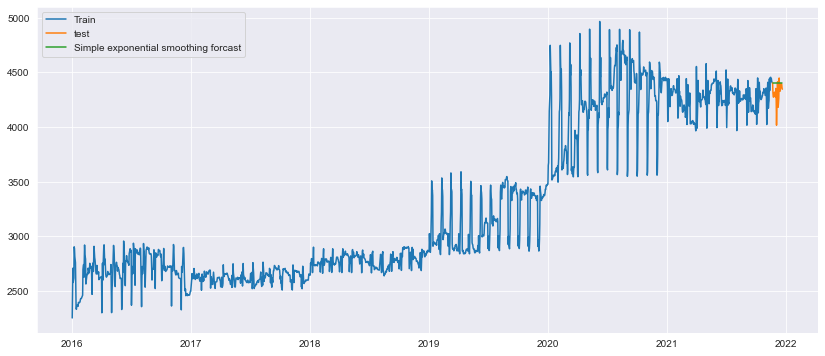

In [49]:
plt.figure(figsize=(14,6))
plt.plot(train_data, label='Train')
plt.plot(test_data, label='test')
plt.plot(test_pred_ses, label='Simple exponential smoothing forcast')
plt.legend(loc='best')
plt.show()

#### Observation
1. The Mean Of the error is far from the error so that there is some bias in the model and also the QQ plot of the error is not linear so the model would perform better 

---
### Holt method (Double Exponential) 

##### Captures both Level and Trend .

In [50]:
dexp_model  = Holt(train_data).fit(optimized=True)
test_pred_dexp = dexp_model.forecast(31)
train_pred_dexp = dexp_model.fittedvalues
test_rmse_dexp = sqrt(mean_squared_error(test_pred_dexp,test_data.price))
train_rmse_dexp = sqrt(mean_squared_error(train_pred_dexp,train_data))
mape_dexp = MAPE(test_pred_dexp,test_data.price)
print('Simple Exponential Method Evaluation',"\n",\
      'Mean Absolute Percent Error = {}'.format(mape_dexp),"\n",\
'Train Root Mean Squared Error = {}'.format(train_rmse_dexp),"\n",
'Test Root Mean Squared Error = {}'.format(test_rmse_dexp))

Simple Exponential Method Evaluation 
 Mean Absolute Percent Error = 3.1405140162089262 
 Train Root Mean Squared Error = 115.62571555632752 
 Test Root Mean Squared Error = 155.91778623313922


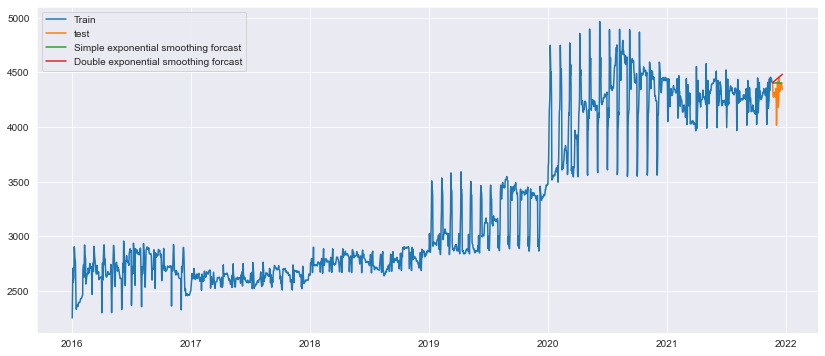

In [51]:
plt.figure(figsize=(14,6))
plt.plot(train_data, label='Train')
plt.plot(test_data, label='test')
plt.plot(test_pred_ses, label='Simple exponential smoothing forcast')
plt.plot(test_pred_dexp, label='Double exponential smoothing forcast')
plt.legend(loc='best')
plt.show()

### Model Evluation

In [52]:
res2=test_pred_dexp-test_data.price
res2

2021-11-21      2.731982
2021-11-22     98.262403
2021-11-23    136.992825
2021-11-24    141.023246
2021-11-25    138.753668
2021-11-26    103.884090
2021-11-27    103.214511
2021-11-28    105.744933
2021-11-29    123.275354
2021-11-30    152.705776
2021-12-01     79.036198
2021-12-02    196.666619
2021-12-03    420.197041
2021-12-04    269.427462
2021-12-05    136.857884
2021-12-06     31.288305
2021-12-07    128.018727
2021-12-08    268.449149
2021-12-09    233.079570
2021-12-10    190.309992
2021-12-11      8.640413
2021-12-12    126.570835
2021-12-13    111.201257
2021-12-14    136.931678
2021-12-15    118.962100
2021-12-16     70.392521
2021-12-17     78.322943
2021-12-18     85.753365
2021-12-19     88.283786
2021-12-20    126.214208
2021-12-21    136.344629
Freq: D, dtype: float64

<AxesSubplot:ylabel='Frequency'>

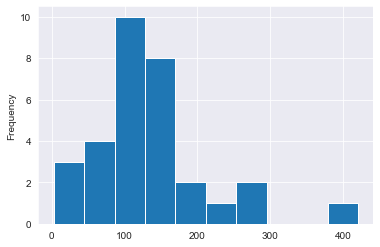

In [53]:
## Histogram and densityplot
res2.plot(kind='hist')

<AxesSubplot:ylabel='Density'>

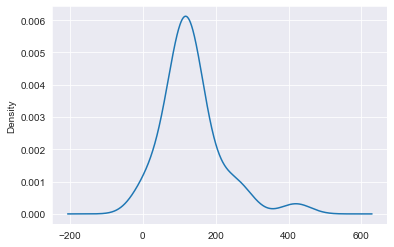

In [54]:
res2.plot(kind='kde')

In [55]:
res2.describe()

count     31.000000
mean     133.791531
std       81.387069
min        2.731982
25%       93.273095
50%      126.214208
75%      139.888457
max      420.197041
dtype: float64

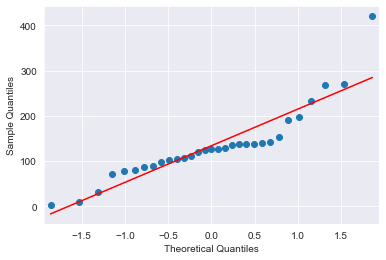

In [56]:
res2=np.array(res2)
smf.qqplot(res2,line='r')
plt.show()

#### Observation
1. We can see that we are able to capture the trend of the data.
2. The Higher mean shows the model is bias.

### Holts winter exponential smoothing with additive seasonality and trend (Triple Exponential)


##### Captures Level, Trend and Seasonality.



In [57]:
texp_add_model  = ExponentialSmoothing(train_data,seasonal="add",trend="add",seasonal_periods=30).fit(optimized=True)
test_pred_ad_texp = texp_add_model.forecast(31)
train_pred_ad_texp = texp_add_model.fittedvalues
test_rmse_ad_texp = sqrt(mean_squared_error(test_pred_ad_texp,test_data.price))
train_rmse_ad_texp = sqrt(mean_squared_error(train_pred_ad_texp,train_data))
mape_ad_texp = MAPE(test_pred_ad_texp,test_data.price)
print('Triple Exponential with Additive Trend and Seosonality Method Evaluation',"\n",\
      'Mean Absolute Percent Error = {}'.format(mape_ad_texp),"\n",\
'Train Root Mean Squared Error = {}'.format(train_rmse_ad_texp),"\n",
'Test Root Mean Squared Error = {}'.format(test_rmse_ad_texp))

Triple Exponential with Additive Trend and Seosonality Method Evaluation 
 Mean Absolute Percent Error = 9.267807971798575 
 Train Root Mean Squared Error = 124.00300881542385 
 Test Root Mean Squared Error = 430.73498354227786


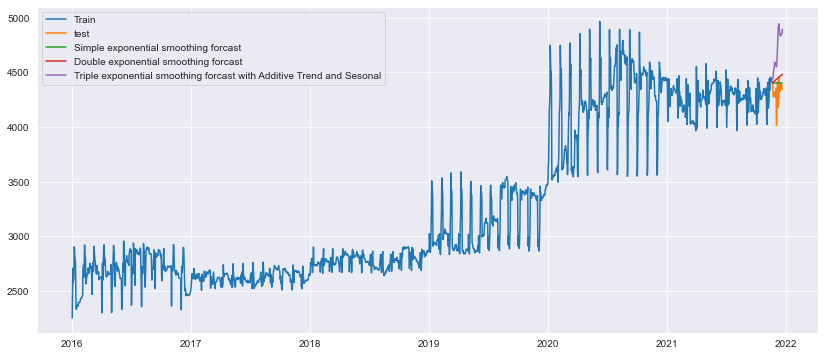

In [58]:
plt.figure(figsize=(14,6))
plt.plot(train_data, label='Train')
plt.plot(test_data, label='test')
plt.plot(test_pred_ses, label='Simple exponential smoothing forcast')
plt.plot(test_pred_dexp, label='Double exponential smoothing forcast')
plt.plot(test_pred_ad_texp, label='Triple exponential smoothing forcast with Additive Trend and Sesonal')
plt.legend(loc='best')
plt.show()

In [59]:
res3=test_pred_ad_texp-test_data.price
res3

2021-11-21     34.749537
2021-11-22    140.345350
2021-11-23    196.465484
2021-11-24    242.107589
2021-11-25    247.953532
2021-11-26    231.361491
2021-11-27    274.984867
2021-11-28    259.522152
2021-11-29    271.812387
2021-11-30    311.227908
2021-12-01    217.843931
2021-12-02    324.860130
2021-12-03    534.574700
2021-12-04    426.827500
2021-12-05    349.335640
2021-12-06    315.776843
2021-12-07    492.974882
2021-12-08    709.017997
2021-12-09    709.397931
2021-12-10    680.445381
2021-12-11    471.813672
2021-12-12    546.424609
2021-12-13    503.949852
2021-12-14    508.077166
2021-12-15    483.432129
2021-12-16    440.135831
2021-12-17    451.444084
2021-12-18    462.292461
2021-12-19    461.055839
2021-12-20    507.525036
2021-12-21    549.184236
Freq: D, dtype: float64

### Model Evluation

<AxesSubplot:ylabel='Frequency'>

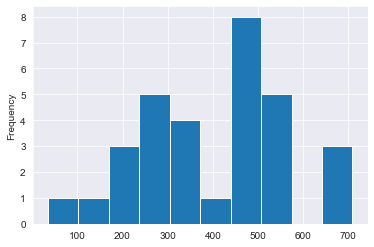

In [60]:
res3.plot(kind='hist')

<AxesSubplot:ylabel='Density'>

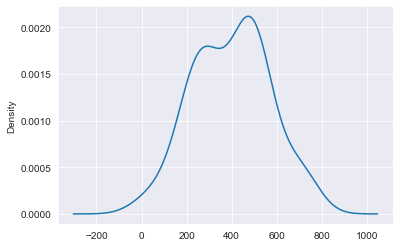

In [61]:
res3.plot(kind='kde')

In [62]:
res3.describe()

count     31.000000
mean     398.610327
std      165.923218
min       34.749537
25%      265.667270
50%      440.135831
75%      505.737444
max      709.397931
dtype: float64

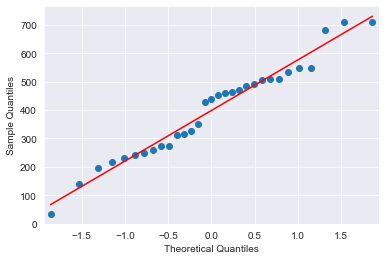

In [63]:
res3=np.array(res3)
smf.qqplot(res3,line='r')
plt.show()

#### Observation
1. It captures the trend, which we can see that the forecasted values are lower level than the test level.
2. It also captures the seasonality.
3. The mean is far away from the 0 so that our model consisting large bias and qqplot is also not linear so we can not used this model for deployment.

### Holts winter exponential smoothing with multiplicative seasonality and additive trend (Triple Exponential)




In [64]:
texp_mul_ad_model  = ExponentialSmoothing(train_data,seasonal="mul",trend="add",seasonal_periods=30).fit(optimized=True)
test_pred_mul_ad_texp = texp_mul_ad_model.forecast(31)
train_pred_mul_ad_texp = texp_mul_ad_model.fittedvalues
test_rmse_mul_ad_texp = sqrt(mean_squared_error(test_pred_mul_ad_texp,test_data.price))
train_rmse_mul_ad_texp = sqrt(mean_squared_error(train_pred_mul_ad_texp,train_data))
mape_mul_ad_texp = MAPE(test_pred_mul_ad_texp,test_data.price)
print('Triple Exponential Method with Multiplicative Seasonality and Additive Trend',"\n",\
      'Mean Absolute Percent Error = {}'.format(mape_mul_ad_texp),"\n",\
'Train Root Mean Squared Error = {}'.format(train_rmse_mul_ad_texp),"\n",
'Test Root Mean Squared Error = {}'.format(test_rmse_mul_ad_texp))

Triple Exponential Method with Multiplicative Seasonality and Additive Trend 
 Mean Absolute Percent Error = 5.641932727442308 
 Train Root Mean Squared Error = 121.32522044927423 
 Test Root Mean Squared Error = 286.2710740652631


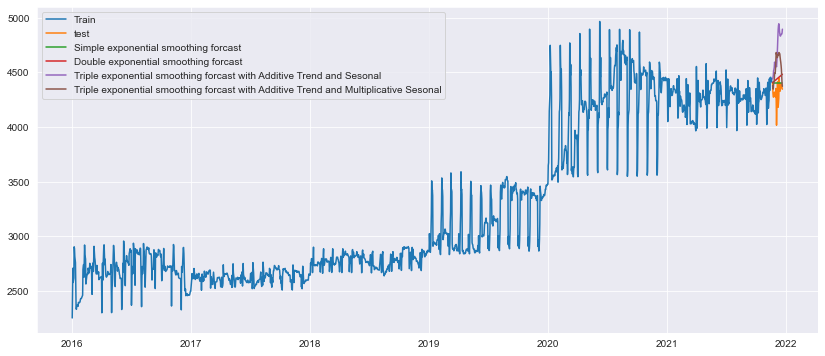

In [65]:
plt.figure(figsize=(14,6))
plt.plot(train_data, label='Train')
plt.plot(test_data, label='test')
plt.plot(test_pred_ses, label='Simple exponential smoothing forcast')
plt.plot(test_pred_dexp, label='Double exponential smoothing forcast')
plt.plot(test_pred_ad_texp, label='Triple exponential smoothing forcast with Additive Trend and Sesonal')
plt.plot(test_pred_mul_ad_texp, label='Triple exponential smoothing forcast with Additive Trend and Multiplicative Sesonal')
plt.legend(loc='best')
plt.show()

### Model Evaluation

In [66]:
res4=test_pred_mul_ad_texp-test_data.price
res4.shape

(31,)

<AxesSubplot:ylabel='Frequency'>

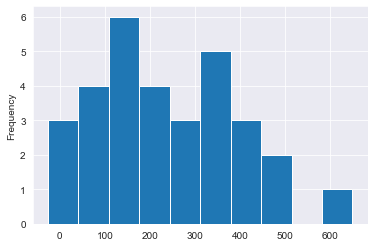

In [67]:
res4.plot(kind='hist')

<AxesSubplot:ylabel='Density'>

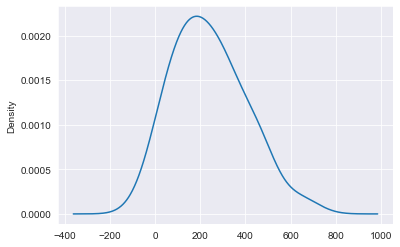

In [68]:
res4.plot(kind='kde')

In [69]:
res4.describe()

count     31.000000
mean     239.304033
std      159.710774
min      -26.140189
25%      123.557774
50%      225.652697
75%      332.406316
max      648.781846
dtype: float64

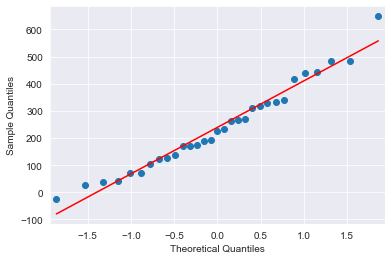

In [70]:
res4=np.array(res4)
smf.qqplot(res4,line='r')
plt.show()

#### Observation
1. We can see that the errors have reduced drastically once we are able to capture the level, trend and seasonality altogether.


### Holts winter exponential smoothing with Additive seasonality and multiplicative trend (Triple Exponential)


#### Observation
1. It captures the trend, which we can see that the forecasted values are higher level than the test level.
2. It also captures the seasonality.
3. The peak of the forecasted value is higher than the actual.

### Holts winter exponential smoothing with multiplicative seasonality and multiplicative trend (Triple Exponential)




In [71]:
texp_ad_mul_model  = ExponentialSmoothing(train_data,seasonal="add",trend="mul",seasonal_periods=30).fit(smoothing_level=0.1, smoothing_slope=0.5)
test_pred_ad_mul_texp  = texp_ad_mul_model.forecast(31)
train_pred_ad_mul_texp  = texp_ad_mul_model.fittedvalues
test_rmse_ad_mul_texp  = sqrt(mean_squared_error(test_pred_ad_mul_texp ,test_data.price))
train_rmse_ad_mul_texp  = sqrt(mean_squared_error(train_pred_ad_mul_texp ,train_data))
mape_ad_mul_texp  = MAPE(test_pred_ad_mul_texp,test_data.price)
print('Triple Exponential Method with Additive Seasonality and Multiplicative Trend',"\n",\
      'Mean Absolute Percent Error = {}'.format(mape_ad_mul_texp ),"\n",\
'Train Root Mean Squared Error = {}'.format(train_rmse_ad_mul_texp ),"\n",
'Test Root Mean Squared Error = {}'.format(test_rmse_ad_mul_texp ))

Triple Exponential Method with Additive Seasonality and Multiplicative Trend 
 Mean Absolute Percent Error = 21.647014281856634 
 Train Root Mean Squared Error = 280.45820592972314 
 Test Root Mean Squared Error = 1069.7869126126468


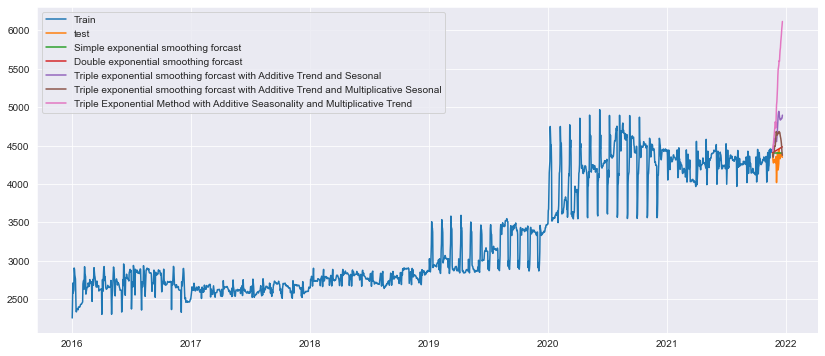

In [72]:
plt.figure(figsize=(14,6))
plt.plot(train_data, label='Train')
plt.plot(test_data, label='test')
plt.plot(test_pred_ses, label='Simple exponential smoothing forcast')
plt.plot(test_pred_dexp, label='Double exponential smoothing forcast')
plt.plot(test_pred_ad_texp, label='Triple exponential smoothing forcast with Additive Trend and Sesonal')
plt.plot(test_pred_mul_ad_texp, label='Triple exponential smoothing forcast with Additive Trend and Multiplicative Sesonal')
plt.plot(test_pred_ad_mul_texp, label='Triple Exponential Method with Additive Seasonality and Multiplicative Trend')
plt.legend(loc='best')
plt.show()

In [73]:
res5=test_pred_ad_mul_texp-test_data.price
res5.shape

(31,)

### Model Evaluation

<AxesSubplot:ylabel='Frequency'>

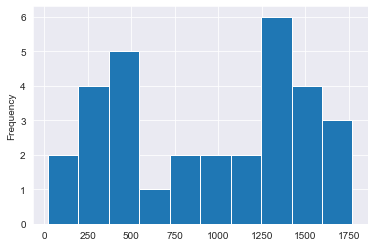

In [74]:
res5.plot(kind='hist')

<AxesSubplot:ylabel='Density'>

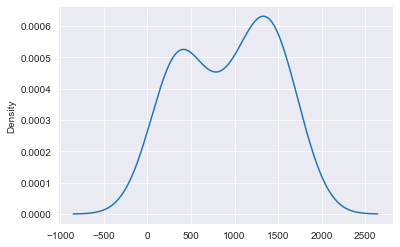

In [75]:
res5.plot(kind='kde')

In [76]:
res5.describe()

count      31.000000
mean      934.344184
std       529.616041
min        22.602024
25%       405.822715
50%      1010.771255
75%      1369.867103
max      1770.061942
dtype: float64

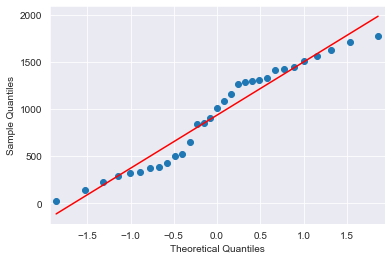

In [77]:
res5=np.array(res5)
smf.qqplot(res5,line='r')
plt.show()

In [78]:
texp_mul_model  = ExponentialSmoothing(train_data,seasonal="mul",trend="mul",seasonal_periods=30).fit(optimized=True)
test_pred_mul_texp  = texp_mul_model.forecast(31)
train_pred_mul_texp  = texp_mul_model.fittedvalues
test_rmse_mul_texp  = sqrt(mean_squared_error(test_pred_mul_texp ,test_data.price))
train_rmse_mul_texp  = sqrt(mean_squared_error(train_pred_mul_texp ,train_data))
mape_mul_texp  = MAPE(test_pred_mul_texp,test_data.price)
print('Triple Exponential Method with multiplicative Trend and Seasonality',"\n",\
      'Mean Absolute Percent Error = {}'.format(mape_mul_texp ),"\n",\
'Train Root Mean Squared Error = {}'.format(train_rmse_mul_texp ),"\n",
'Test Root Mean Squared Error = {}'.format(test_rmse_mul_texp ))

Triple Exponential Method with multiplicative Trend and Seasonality 
 Mean Absolute Percent Error = 4.878254555745036 
 Train Root Mean Squared Error = 129.48429931284468 
 Test Root Mean Squared Error = 256.07378437831153


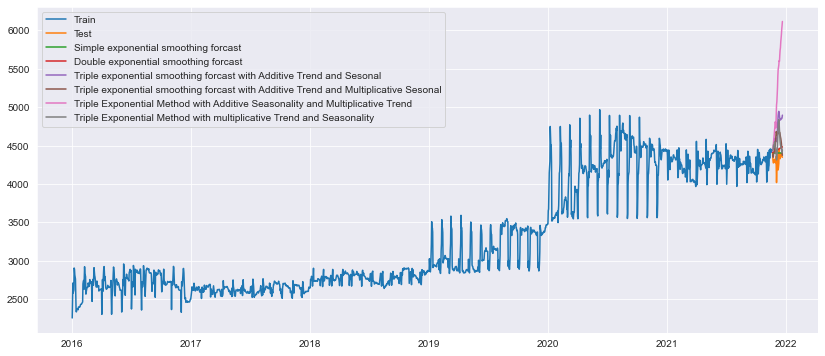

In [79]:
plt.figure(figsize=(14,6))
plt.plot(train_data, label='Train')
plt.plot(test_data, label='Test')
plt.plot(test_pred_ses, label='Simple exponential smoothing forcast')
plt.plot(test_pred_dexp, label='Double exponential smoothing forcast')
plt.plot(test_pred_ad_texp, label='Triple exponential smoothing forcast with Additive Trend and Sesonal')
plt.plot(test_pred_mul_ad_texp, label='Triple exponential smoothing forcast with Additive Trend and Multiplicative Sesonal')
plt.plot(test_pred_ad_mul_texp, label='Triple Exponential Method with Additive Seasonality and Multiplicative Trend')
plt.plot(test_pred_mul_texp, label='Triple Exponential Method with multiplicative Trend and Seasonality')
plt.legend(loc='best')
plt.show()

###  Model Evluation

In [80]:
res5=test_pred_mul_texp -test_data.price
res5.shape

(31,)

<AxesSubplot:ylabel='Frequency'>

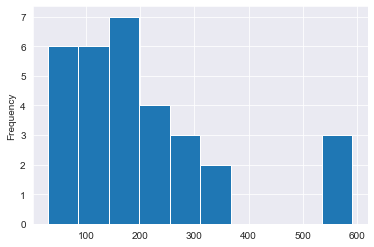

In [81]:
res5.plot(kind='hist')

<AxesSubplot:ylabel='Density'>

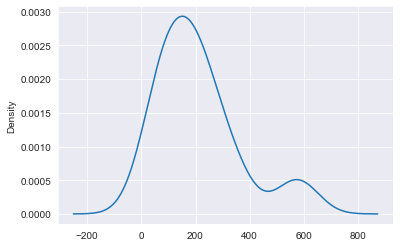

In [82]:
res5.plot(kind='kde')

In [83]:
res5.describe()

count     31.000000
mean     208.856997
std      150.613044
min       29.549035
25%       96.107212
50%      183.094828
75%      252.533375
max      592.001337
dtype: float64

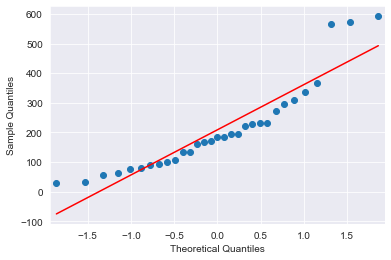

In [84]:
res5=np.array(res5)
smf.qqplot(res5,line='r')
plt.show()

In [85]:
#Comparing the results 

Evaluation = {"Models":pd.Series(["Simple_Exp","Double_Exp","Triple_Exp_ad","Triple_Exp_mul_ad","Triple_Exp_ad_mul"\
                                  ,"Triple_Exp_mul"]),\
        "Train_RMSE":pd.Series([train_rmse_ses,train_rmse_dexp,train_rmse_ad_texp,train_rmse_mul_ad_texp,train_rmse_ad_mul_texp,train_rmse_mul_texp]),\
        "Test_MAPE(%)":pd.Series([mape_ses,mape_dexp,mape_ad_texp,mape_mul_ad_texp,mape_ad_mul_texp,mape_mul_texp]),\
        "Test_RMSE_Values":pd.Series([test_rmse_ses,test_rmse_dexp,test_rmse_ad_texp,test_rmse_mul_ad_texp,test_rmse_ad_mul_texp,test_rmse_mul_texp])}
table_evaluation=pd.DataFrame(Evaluation)
table_evaluation.sort_values(['Test_MAPE(%)'], inplace=True, ignore_index=True)
table_evaluation

,Models,Train_RMSE,Test_MAPE(%),Test_RMSE_Values
0,Simple_Exp,114.270475,2.279408,125.372149
1,Double_Exp,115.625716,3.140514,155.917786
2,Triple_Exp_mul,129.484299,4.878255,256.073784
3,Triple_Exp_mul_ad,121.325220,5.641933,286.271074
4,Triple_Exp_ad,124.003009,9.267808,430.734984
5,Triple_Exp_ad_mul,280.458206,21.647014,1069.786913


### Visualizing Models Performance


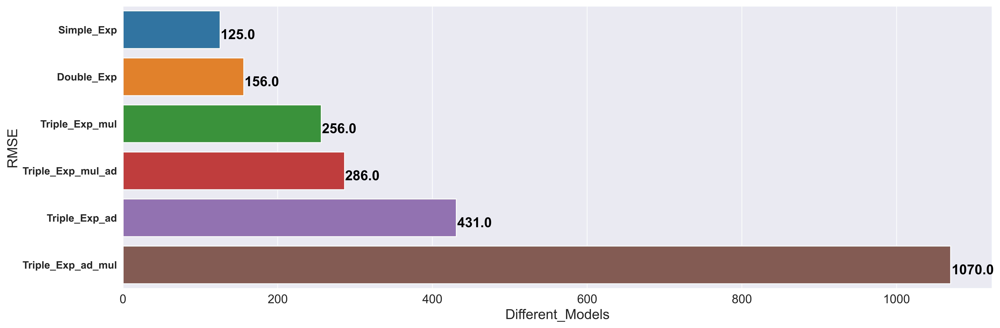

In [86]:
f, axe = plt.subplots(1,1, figsize=(18,6), dpi=500)
sns.barplot(x='Test_RMSE_Values', y='Models', data=table_evaluation, ax = axe)
axe.set_xlabel('Different_Models', size=16)
axe.set_ylabel('RMSE', size=16)
plt.yticks(fontsize=12,fontweight = 'bold')
plt.xticks(fontsize=14)


for i, v in enumerate(np.round(table_evaluation.Test_RMSE_Values.values,0)):
    axe.text(v + 1, i + .20, str(v),
            color = 'black', fontweight = 'bold', fontsize= 16)

plt.show()

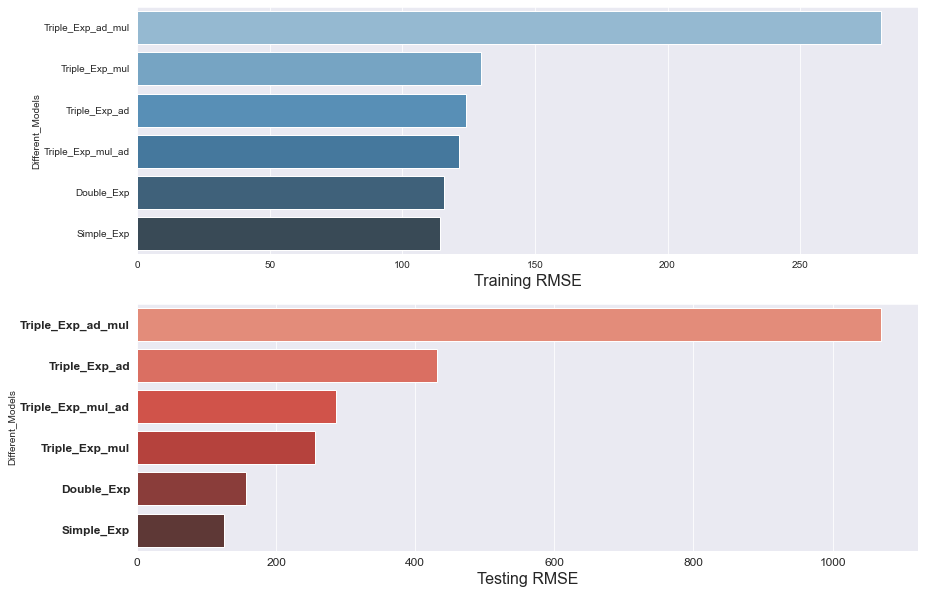

In [87]:
f, axes = plt.subplots(2,1, figsize=(14,10))
plt.yticks(fontsize=12,fontweight = 'bold')
plt.xticks(fontsize=12)
train_rmse = table_evaluation.sort_values(by=['Train_RMSE'], ascending=False)

sns.barplot(x='Train_RMSE', y='Models', data = train_rmse, palette='Blues_d', ax = axes[0])
axes[0].set_xlabel('Training RMSE', size=16)
axes[0].set_ylabel('Different_Models')

test_rmse = table_evaluation.sort_values(by=['Test_RMSE_Values'], ascending=False)

sns.barplot(x='Test_RMSE_Values', y='Models', data = test_rmse, palette='Reds_d', ax = axes[1])
axes[1].set_xlabel('Testing RMSE', size=16)
axes[1].set_ylabel('Different_Models')

plt.show()

# Autoregressive Integrated Moving Averages (ARIMA)

Recall that an <strong>AR(1)</strong> model follows the formula

&nbsp;&nbsp;&nbsp;&nbsp;$y_{t} = c + \phi_{1}y_{t-1} + \varepsilon_{t}$

while an <strong>MA(1)</strong> model follows the formula

&nbsp;&nbsp;&nbsp;&nbsp;$y_{t} = \mu + \theta_{1}\varepsilon_{t-1} + \varepsilon_{t}$

where $c$ is a constant, $\mu$ is the expectation of $y_{t}$ (often assumed to be zero), $\phi_1$ is the AR lag coefficient, $\theta_1$ (theta-sub-one) is the MA lag coefficient, and $\varepsilon$ (epsilon) is white noise.

An <strong>ARMA(1,1)</strong> model therefore follows

&nbsp;&nbsp;&nbsp;&nbsp;$y_{t} = c + \phi_{1}y_{t-1} + \theta_{1}\varepsilon_{t-1} + \varepsilon_{t}$
#### Stationary vs Non-stationary Time Series


### Test of Stationarity


##### As we have yearly data the window size for moving average is equal to 12



In [88]:
def test_stationarity(timeseries):
    
    #Determine rolling statistics
    movingAverage = timeseries.rolling(window=30).mean()
    movingSTD = timeseries.rolling(window=30).std()
    
    #Plot rolling statistics
    orig = plt.plot(timeseries, color='blue', label='Original')
    mean = plt.plot(movingAverage, color='red', label='Rolling Mean')
    plt.legend(loc='best')
    plt.title('Rolling Mean')
    plt.show(block=False)
    
    #Perform Dickey–Fuller test:
    print('Results of Dickey Fuller Test:')
    dftest = adfuller(timeseries['price'], autolag='AIC')
    dfoutput = pd.Series(dftest[0:4], index=['Test Statistic','p-value','#Lags Used','Number of Observations Used'])
    for key,value in dftest[4].items():
        dfoutput['Critical Value (%s)'%key] = value
    print(dfoutput)

#### Augmented Dicky Fuller Test
Null Hypothesis (H0): The series is not stationary

p-val > 0.05

Alternate Hypothesis (H1): The series is stationary

p-val <= 0.05

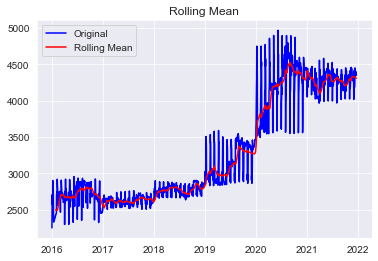

Results of Dickey Fuller Test:
Test Statistic                   -0.309904
p-value                           0.924090
#Lags Used                       26.000000
Number of Observations Used    2155.000000
Critical Value (1%)              -3.433388
Critical Value (5%)              -2.862882
Critical Value (10%)             -2.567484
dtype: float64


In [89]:
gold_price= pd.DataFrame()
gold_price=df1[['price']]
gold_price['price'] = df1[['price']]
test_stationarity(gold_price)

In [90]:
from statsmodels.tsa.stattools import adfuller
def adf_test(series):    
    result = adfuller(series.dropna())  
    labels = ['ADF test statistic','p-value','# lags used','# observations']
    out = pd.Series(result[0:4],index=labels)
    #for key,val in result[4].items():
        #out[f'critical value ({key})']=val
    if result[1] <= 0.05:
        print("Reject the null hypothesis")
        print("Data is stationary")
    else:
        print("Fail to reject the null hypothesis")
        print("Data is non-stationary")

In [91]:
adf_test(gold_price)

Fail to reject the null hypothesis
Data is non-stationary


### Feature Scaling (Transformations)

#### Square Root Transform



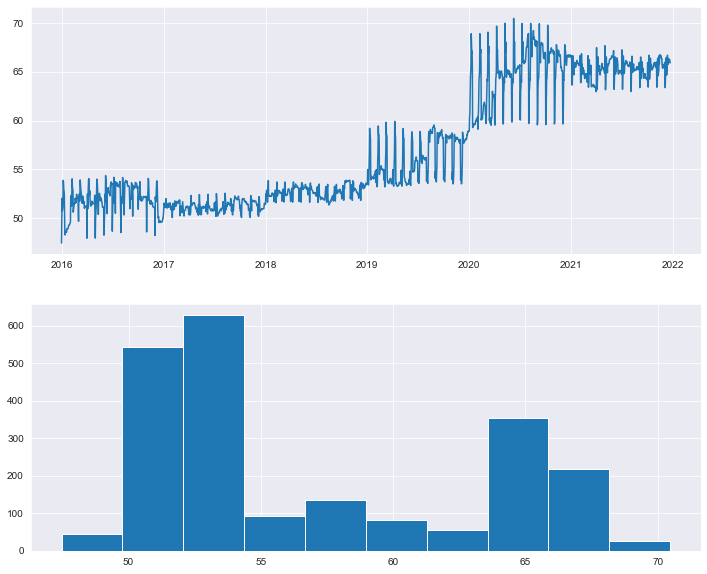

In [92]:
square_root= pd.DataFrame()
square_root = df1[['price']]
square_root['price'] = np.sqrt(square_root.price)

# line chart
fig=plt.figure(figsize=(12,10))
plt.subplot(211)
plt.plot(square_root['price'])
#Histogram
plt.subplot(212)
plt.hist(square_root['price'])
plt.show()

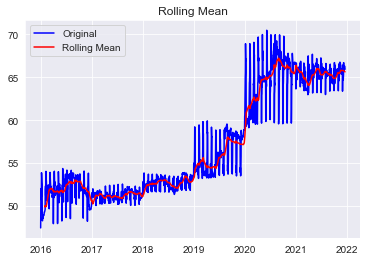

Results of Dickey Fuller Test:
Test Statistic                   -0.372419
p-value                           0.914603
#Lags Used                       26.000000
Number of Observations Used    2155.000000
Critical Value (1%)              -3.433388
Critical Value (5%)              -2.862882
Critical Value (10%)             -2.567484
dtype: float64


In [93]:
test_stationarity(square_root)

In [94]:
adf_test(square_root)

Fail to reject the null hypothesis
Data is non-stationary


### Log Transform

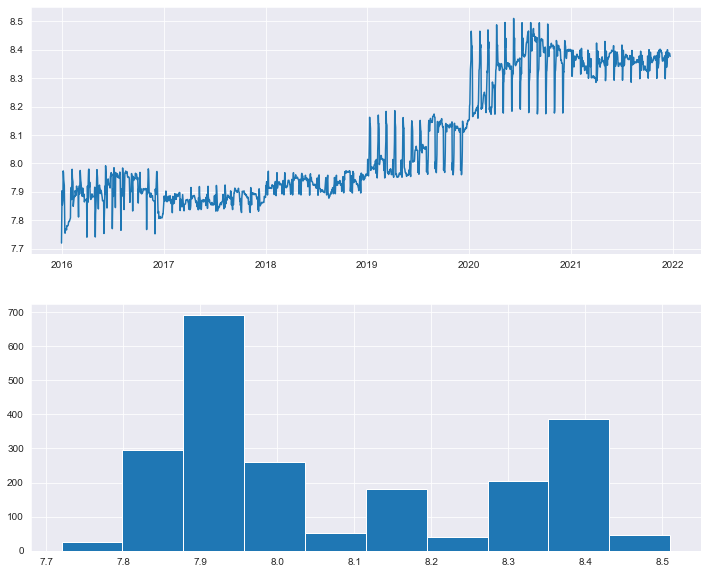

In [95]:
log = pd.DataFrame()
log = df1[['price']]
log['price'] = np.log(log.price)

# line chart
fig=plt.figure(figsize=(12,10))
plt.subplot(211)
plt.plot(log['price'])
#Histogram
plt.subplot(212)
plt.hist(log['price'])
plt.show()

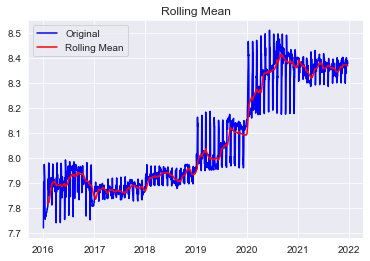

Results of Dickey Fuller Test:
Test Statistic                   -0.457214
p-value                           0.900099
#Lags Used                       26.000000
Number of Observations Used    2155.000000
Critical Value (1%)              -3.433388
Critical Value (5%)              -2.862882
Critical Value (10%)             -2.567484
dtype: float64


In [96]:
test_stationarity(log)

In [97]:
adf_test(log)

Fail to reject the null hypothesis
Data is non-stationary


##### Hence, the Time series data is Non-Stationary

### Converting Non-Stationary Time Series into Stationary

#### Differencing
In this method, we compute the difference of consecutive terms in the series. Differencing is typically performed to get rid of the varying mean. Mathematically, differencing can be written as:

yt‘ = yt – y(t-1)

where yt is the value at a time t

Applying differencing on our series and plotting the results:

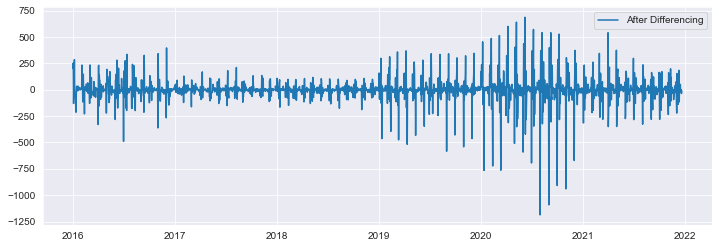

In [98]:
differencing = df1 - df1.shift(1)
differencing.dropna(inplace=True)
plt.figure(figsize=(12,4))
plt.plot(differencing, label='After Differencing')
plt.legend(loc='best')
plt.show()

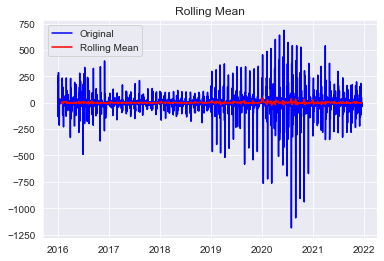

Results of Dickey Fuller Test:
Test Statistic                  -21.664542
p-value                           0.000000
#Lags Used                       26.000000
Number of Observations Used    2154.000000
Critical Value (1%)              -3.433390
Critical Value (5%)              -2.862883
Critical Value (10%)             -2.567485
dtype: float64


In [99]:
test_stationarity(differencing)

In [100]:
adf_test(differencing)

Reject the null hypothesis
Data is stationary


#### Seasonal Differencing
In seasonal differencing, instead of calculating the difference between consecutive values, we calculate the difference between an observation and a previous observation from the same season. For example, an observation taken on a Monday will be subtracted from an observation taken on the previous Monday. Mathematically it can be written as:

yt‘ = yt – y(t-n)

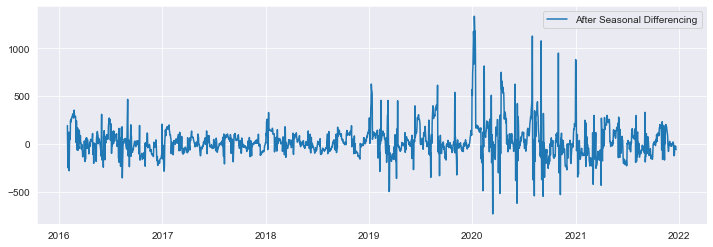

In [101]:
seasonal_differencing = df1 - df1.shift(30)
seasonal_differencing.dropna(inplace=True)
plt.figure(figsize=(12,4))
plt.plot(seasonal_differencing, label='After Seasonal Differencing')
plt.legend(loc='best')
plt.show()

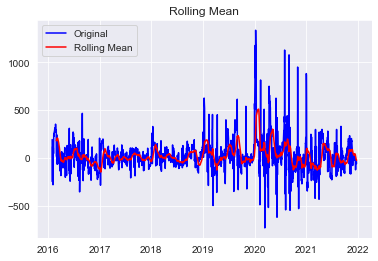

Results of Dickey Fuller Test:
Test Statistic                -1.001262e+01
p-value                        1.762328e-17
#Lags Used                     7.000000e+00
Number of Observations Used    2.144000e+03
Critical Value (1%)           -3.433404e+00
Critical Value (5%)           -2.862889e+00
Critical Value (10%)          -2.567488e+00
dtype: float64


In [102]:
test_stationarity(seasonal_differencing)

In [103]:
adf_test(seasonal_differencing)

Reject the null hypothesis
Data is stationary


#### Transformation
Transformations are used to stabilize the non-constant variance of a series. Common transformation methods include power transform, square root, and log transform. Let’s do a quick log transform and differencing on our air passenger dataset:

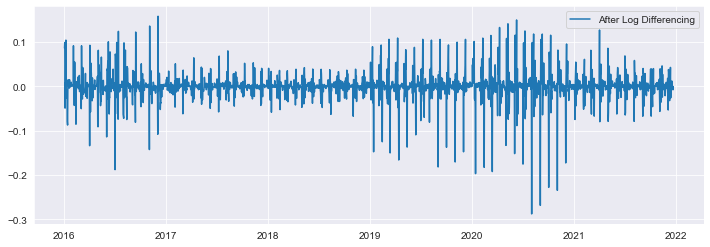

In [104]:
log_diff = log - log.shift(1)
log_diff.dropna(inplace=True)
plt.figure(figsize=(12,4))
plt.plot(log_diff, label='After Log Differencing')
plt.legend(loc='best')
plt.show()

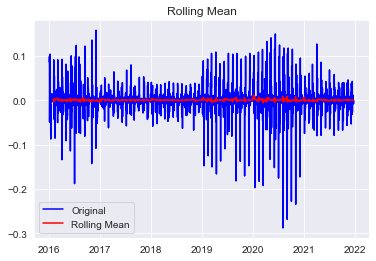

Results of Dickey Fuller Test:
Test Statistic                  -21.394232
p-value                           0.000000
#Lags Used                       26.000000
Number of Observations Used    2154.000000
Critical Value (1%)              -3.433390
Critical Value (5%)              -2.862883
Critical Value (10%)             -2.567485
dtype: float64


In [105]:
test_stationarity(log_diff)

In [106]:
adf_test(log_diff)

Reject the null hypothesis
Data is stationary


#### Box Cox Transformation

,price
date,
2016-01-01,7.719840
2016-01-02,7.805678
2016-01-03,7.904003
2016-01-04,7.854692
2016-01-05,7.862401


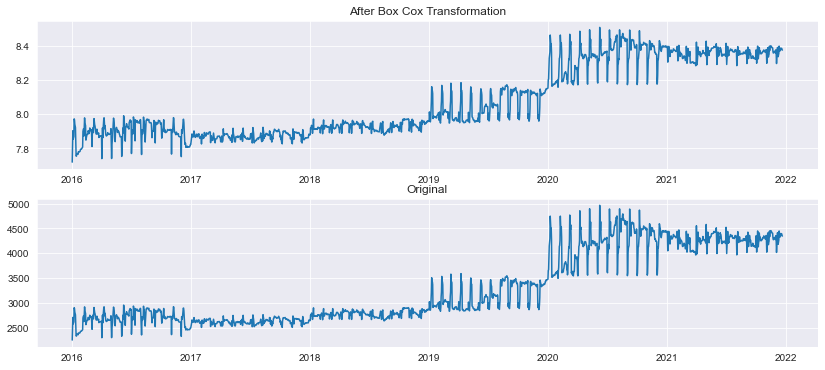

In [107]:
data_boxcox = pd.DataFrame()
data_boxcox['price'] = pd.Series(boxcox(df1['price'], lmbda=0), df1.index)
display(data_boxcox.head())
fig, axis = plt.subplots(2,figsize=(14,6),)
axis[0].plot(data_boxcox)
axis[0].set_title('After Box Cox Transformation')
axis[1].plot(df1, label='original')
axis[1].set_title('Original')
plt.show()

#### Observation
1. We can see the variance became little constant after the transformation. Both in the earlier and later years the variance is little close to  similar.
2. But we can see that still the series has an upward trend. So, the mean is not constant yet. Hence, we need to do `Differencing` for making the mean constant.

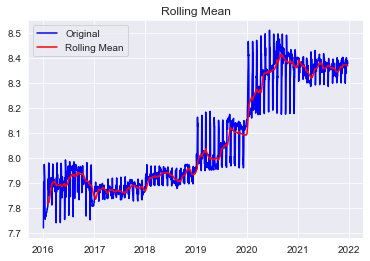

Results of Dickey Fuller Test:
Test Statistic                   -0.457214
p-value                           0.900099
#Lags Used                       26.000000
Number of Observations Used    2155.000000
Critical Value (1%)              -3.433388
Critical Value (5%)              -2.862882
Critical Value (10%)             -2.567484
dtype: float64


In [108]:
test_stationarity(data_boxcox)

In [109]:
adf_test(data_boxcox)

Fail to reject the null hypothesis
Data is non-stationary


#### Differencing of the Box-Cox Transformation
Differencing is performed by subtracting the previous observation from the current observation.

Differencing removes trend and seasonality in a Time series. When an entire cycle is used for differencing the other cycle, then the seasonality is removed.

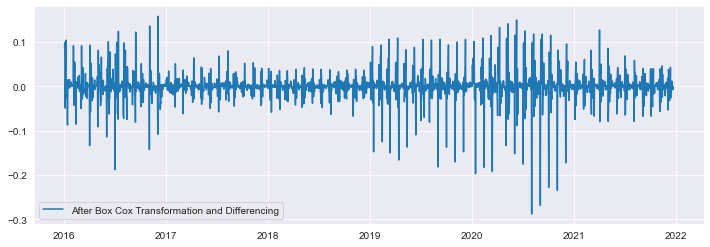

In [110]:
# data_boxcox - data_boxcox.shift() :- Performs difference between the previous and current observations.
data_boxcox_diff = data_boxcox - data_boxcox.shift()
data_boxcox_diff.dropna(inplace=True)
plt.figure(figsize=(12,4))
plt.plot(data_boxcox_diff, label='After Box Cox Transformation and Differencing')
plt.legend(loc='best')
plt.show()

In [111]:
data_boxcox_diff

,price
date,
2016-01-02,0.085838
2016-01-03,0.098324
2016-01-04,-0.049311
2016-01-05,0.007709
2016-01-06,0.007650
...,...
2021-12-17,-0.001228
2021-12-18,-0.001116
2021-12-19,0.000000


#### Observation
1. We can see that there is no trend (upward or downward) after differencing on the Box Cox transformation. 
2. It is a horizontal trend.
3. The mean became constant. The mean is zero.
4. Also, the variance is little constant.

Lets test the Stationarity again.

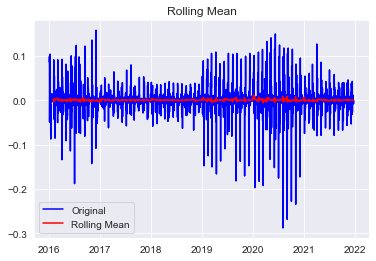

Results of Dickey Fuller Test:
Test Statistic                  -21.394232
p-value                           0.000000
#Lags Used                       26.000000
Number of Observations Used    2154.000000
Critical Value (1%)              -3.433390
Critical Value (5%)              -2.862883
Critical Value (10%)             -2.567485
dtype: float64


In [112]:
#check this log transfered data with function
test_stationarity(data_boxcox_diff)

In [113]:
adf_test(data_boxcox_diff)

Reject the null hypothesis
Data is stationary


***order(p,d,q)***

p = Periods to lag for eg: (if P= 3 then we will use the three previous periods of our time series in the autoregressive portion of the calculation) P helps adjust the line that is being fitted to forecast the series.

d = In an ARIMA model we transform a time series into stationary one(series without trend or seasonality) using differencing. D refers to the number of differencing transformations required by the time series to get stationary.


q = This variable denotes the lag of the error component, where error component is a part of the time series not explained by trend or seasonality.

In [114]:
# grid search ARIMA parameters for a time series

# evaluate an ARIMA model for a given order (p,d,q) and return RMSE
def evaluate_arima_model(X, arima_order):
# prepare training dataset
    X = X.astype('float32')
    train_size = int(len(X) * 0.70)
    train, test = X[0:train_size], X[train_size:]
    history = [x for x in train]
# make predictions
    predictions = list()
    for t in range(len(test)):
        model = ARIMA(history, order=arima_order)
        model_fit = model.fit()
        yhat = model_fit.forecast()[0]
        predictions.append(yhat)
        history.append(test[t])
# calculate out of sample error
    rmse = sqrt(mean_squared_error(test, predictions))
    return rmse

In [115]:
# evaluate combinations of p, d and q values for an ARIMA model
def evaluate_models(dataset, p_values, d_values, q_values):
    dataset = dataset.astype('float32')
    best_score, best_cfg = float('inf'), None
    for p in p_values:
        for d in d_values:
            for q in q_values:
                order = (p,d,q)
                try:
                    rmse = evaluate_arima_model(dataset, order)
                    if rmse < best_score:
                        best_score, best_cfg = rmse, order
                    #print('ARIMA%s RMSE=%.3f' % (order,rmse))
                except Exception as e:
                    print(e)
                    continue
    print('Best ARIMA%s RMSE=%.3f' % (best_cfg, best_score))

In [129]:
# evaluate parameters
p_values = range(0, 1)
d_values = range(0, 1)
q_values = range(0, 1)
evaluate_models(data_boxcox_diff.price, p_values, d_values, q_values)

Best ARIMA(0, 0, 0) RMSE=0.038


#### Building The Time Series Forecasting with Optimal Value using ARIMA
Automatically performs the Differencing if the series has trend.

Hence, no need to manually perform the differencing.



In [116]:
data_boxcox

,price
date,
2016-01-01,7.719840
2016-01-02,7.805678
2016-01-03,7.904003
2016-01-04,7.854692
2016-01-05,7.862401
...,...
2021-12-17,8.388086
2021-12-18,8.386971
2021-12-19,8.386971


In [117]:
import pickle
pickle.dump(data_boxcox,open('Data.pkl','wb'))

In [118]:
train_data_boxcox = data_boxcox[:size]
test_data_boxcox_diff = data_boxcox[size:]
train_data_boxcox_diff = data_boxcox_diff[:size]
test_data_boxcox_diff = data_boxcox_diff[size:]

##### Inverse transformation of the Box-Cox Differencing 
As we have converted the original time series to Stationary series by consecutively applying BoxCox transformation and Differencing. We have to transform the series back to the original one (step by step).



In [119]:
model = ARIMA(train_data_boxcox_diff, order=(1, 0, 1))
model_fit = model.fit()
y_hat_ar = data_boxcox_diff.copy()
y_hat_ar['arima_forecast'] = model_fit.predict(data_boxcox_diff.index.min(), data_boxcox_diff.index.max())
# We did differencing. So we need to revert it by adding the consecutive observations.
# For that we are using cumsum() method
y_hat_ar['arima_forecast'] = y_hat_ar['arima_forecast'].cumsum()
# We removed the first observations after differencing as it was null. Hence, adding the first observation back.
y_hat_ar['arima_forecast'] = y_hat_ar['arima_forecast'].add(data_boxcox.price[0])
# Now doing the reverse transformation 
# We have done Box Cox Log Log transformation with lambda = 0
# Hence, we have to the exponential as it is the reverse of the log.
y_hat_ar['arima_forecast'] = np.exp(y_hat_ar['arima_forecast'])

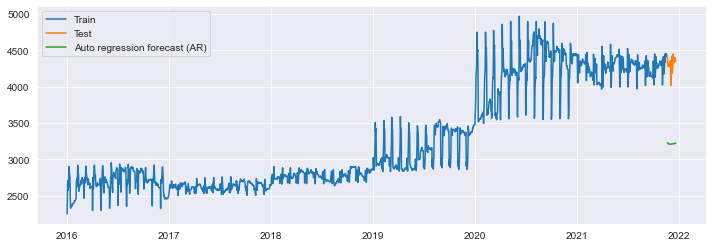

In [120]:
plt.figure(figsize=(12,4))
plt.plot(train_data['price'], label='Train')
plt.plot(test_data, label='Test')
plt.plot(y_hat_ar['arima_forecast'][test_data.index.min():], label='Auto regression forecast (AR)')
plt.legend(loc='best')
plt.show()

### Model Evaluation

In [121]:
res6=model_fit.resid

<AxesSubplot:ylabel='Frequency'>

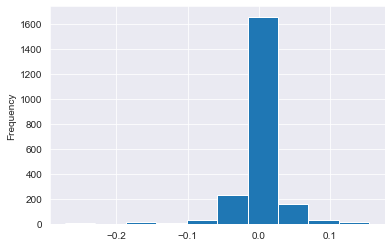

In [122]:
res6.plot(kind='hist')

<AxesSubplot:ylabel='Density'>

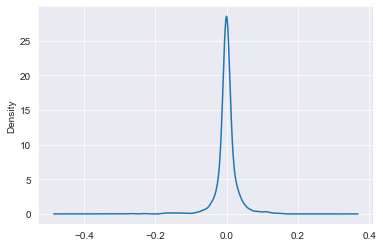

In [123]:
res6.plot(kind='kde')

In [124]:
res6.describe()

count    2150.000000
mean        0.000143
std         0.030770
min        -0.272162
25%        -0.007676
50%        -0.000002
75%         0.008340
max         0.155050
dtype: float64

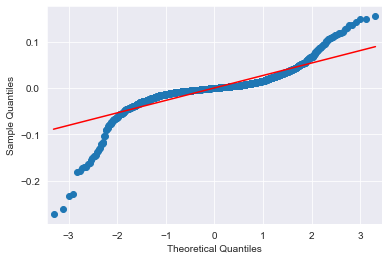

In [125]:
res6=np.array(res6)
smf.qqplot(res6,line='r')
plt.show()

#### Observation
1. This model is the Best model as the mean of the error is near to zero and this indicates that ther is very low bias in the model.
2. The QQ plot also shows linear behaviour so that this model can be used for the deployment


### Model Evaluation

#### RMSE (Root Mean Squared Error)

In [126]:
rmse_ARIMA = np.sqrt(mean_squared_error(test_data, y_hat_ar['arima_forecast'][test_data.index.min():])).round(2)
rmse_ARIMA

1098.19

#### MAPE (Mean Absolute Percent Error)

In [127]:
mape_arima = round(np.mean(np.abs((test_data.price - y_hat_ar['arima_forecast'][test_data.index.min():])/test_data.price)*100),2)
mape_arima

25.38

### Analysing the Residuals

##### The mean of the Residual should be zero or close to Zero



In [128]:
model_residual = model_fit.resid
model_residual.mean()

0.00014269916316225496

#### Residuals must be stationary


In [129]:
adf_test(model_residual)

Reject the null hypothesis
Data is stationary


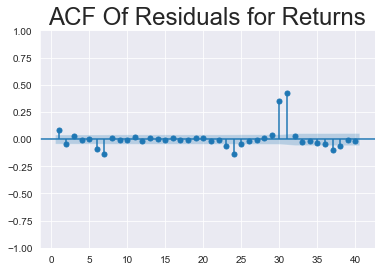

In [130]:
plot_acf(model_residual, zero = False, lags = 40)
plt.title("ACF Of Residuals for Returns",size=24)
plt.show()

#### Residuals must be random

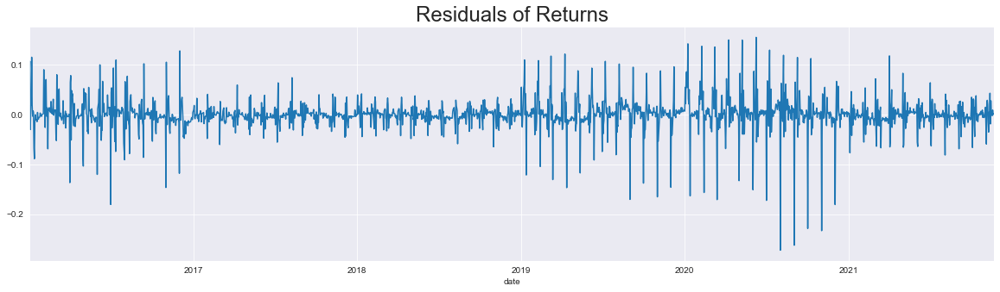

In [131]:
model_residual.plot(figsize=(20,5))
plt.title("Residuals of Returns", size=24)
plt.show()

### Seasonal Auto Regressive Integrated Moving Average (SARIMA)
ARIMA with Seasonal component added.

In [132]:
from statsmodels.tsa.statespace.sarimax import SARIMAX
# We are only passing the Box Cox because the ARIMAX will perform the differencing internally
# seasonal_order P=1, Q=1, D=1 and m=12
# m=12 . Because the seasonality is monthly.

In [133]:
model = SARIMAX(train_data_boxcox, order=(1,1,1), seasonal_order=(1,1,1,12))
final_model= model.fit()
y_hat_sarima = data_boxcox_diff.copy()

#### Inverse Transformation of the Differencing Box-Cox Transformation
Note that ARIMAM automatically takes care of the reversing of `Differencing` (takes care the `Integration` part automatically). So, we don't need to perform the cumsum here. We only have to do the reverse of the log boc cox transformation.

In ARIMA, we had to perform the cumsum manually.

In [134]:
y_hat_sarima['sarima_forecast_boxcox'] = final_model.predict(data_boxcox_diff.index.min(), data_boxcox_diff.index.max())
y_hat_sarima['sarima_forecast'] = np.exp(y_hat_sarima['sarima_forecast_boxcox'])
y_hat_sarima['sarima_forecast'] = np.exp(y_hat_sarima['sarima_forecast_boxcox'])

In [135]:
y_hat_sarima['sarima_forecast_boxcox'] = final_model.predict(data_boxcox_diff.index.min(), data_boxcox_diff.index.max())
y_hat_sarima['sarima_forecast_boxcox']

date
2016-01-02    7.719840
2016-01-03    7.805678
2016-01-04    7.904003
2016-01-05    7.854692
2016-01-06    7.862401
                ...   
2021-12-17    8.381870
2021-12-18    8.383140
2021-12-19    8.382899
2021-12-20    8.384565
2021-12-21    8.384528
Name: sarima_forecast_boxcox, Length: 2181, dtype: float64

In [136]:
final_model.forecast(60)

2021-11-21    8.388667
2021-11-22    8.385666
2021-11-23    8.381041
2021-11-24    8.381388
2021-11-25    8.379928
2021-11-26    8.380878
2021-11-27    8.380253
2021-11-28    8.380277
2021-11-29    8.380016
2021-11-30    8.381962
2021-12-01    8.379431
2021-12-02    8.381947
2021-12-03    8.382782
2021-12-04    8.381712
2021-12-05    8.379057
2021-12-06    8.380275
2021-12-07    8.379998
2021-12-08    8.381634
2021-12-09    8.381573
2021-12-10    8.381944
2021-12-11    8.382074
2021-12-12    8.384214
2021-12-13    8.381885
2021-12-14    8.384522
2021-12-15    8.385459
2021-12-16    8.384467
2021-12-17    8.381870
2021-12-18    8.383140
2021-12-19    8.382899
2021-12-20    8.384565
2021-12-21    8.384528
2021-12-22    8.384918
2021-12-23    8.385062
2021-12-24    8.387214
2021-12-25    8.384894
2021-12-26    8.387539
2021-12-27    8.388481
2021-12-28    8.387494
2021-12-29    8.384901
2021-12-30    8.386174
2021-12-31    8.385935
2022-01-01    8.387603
2022-01-02    8.387567
2022-01-03 

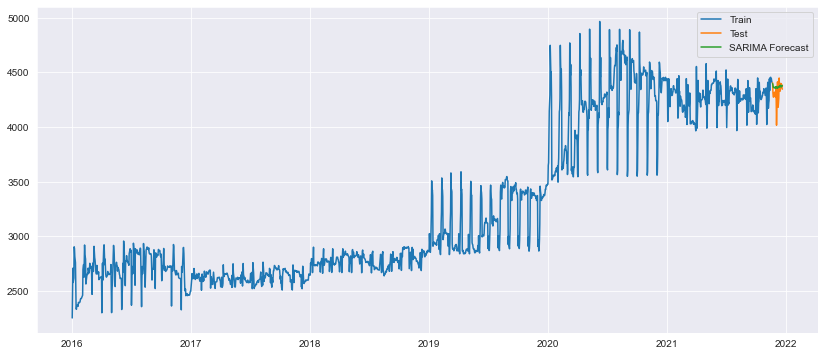

In [137]:
plt.figure(figsize=(14,6))
plt.plot(train_data['price'], label='Train')
plt.plot(test_data, label='Test')
plt.plot(y_hat_sarima['sarima_forecast'][test_data.index.min():], label='SARIMA Forecast')
plt.legend(loc='best')
plt.show()

In [138]:
y_hat=final_model.forecast(80)
y_hat=np.exp(y_hat)

### Model Evaluation

In [146]:
res7=model_fit.resid
res7

date
2016-01-02    0.085587
2016-01-03    0.107113
2016-01-04   -0.030074
2016-01-05    0.019035
2016-01-06    0.018978
                ...   
2021-11-16   -0.002088
2021-11-17    0.009022
2021-11-18    0.000116
2021-11-19    0.000701
2021-11-20    0.001635
Length: 2150, dtype: float64

<AxesSubplot:ylabel='Frequency'>

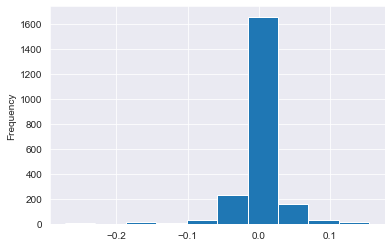

In [147]:
res7.plot(kind='hist')

<AxesSubplot:ylabel='Density'>

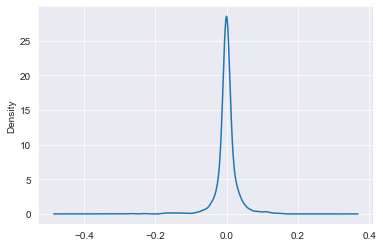

In [148]:
res7.plot(kind='kde')

In [149]:
res7.describe()

count    2150.000000
mean        0.000143
std         0.030770
min        -0.272162
25%        -0.007676
50%        -0.000002
75%         0.008340
max         0.155050
dtype: float64

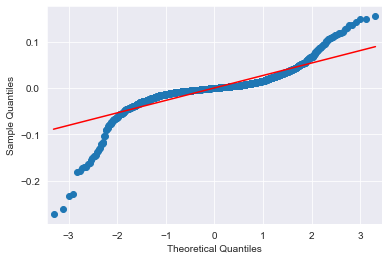

In [150]:
res7=np.array(res7)
smf.qqplot(res7,line='r')
plt.show()

##### We can see that we are able to capture the trend and seasonality both.

### Model Evaluation

#### RMSE (Root Mean Squared Error)

In [151]:
rmse_SARIMA = np.sqrt(mean_squared_error(test_data, y_hat_sarima['sarima_forecast'][test_data.index.min():])).round(2)
rmse_SARIMA

100.69

#### MAPE (Mean Absolute Percent Error)

In [152]:
mape_sarima = round(np.mean(np.abs((test_data.price - y_hat_sarima['sarima_forecast'][test_data.index.min():])/test_data.price)*100),2)
mape_sarima

1.71

#### Observation:
1. SARIMA model shows best result its mean is near to zero so ther is no bias in the model.
2. The QQ plot of the error shows the linear behaviour so that this model is best for the deployment.



### Analysing the Residuals

##### The mean of the Residual should be zero or close to Zero





In [153]:
model_residual = model_fit.resid
model_residual.mean()

0.00014269916316225496

#### Residuals must be stationary



In [154]:
adf_test(model_residual)

Reject the null hypothesis
Data is stationary


#### No autocorrelation between residuals



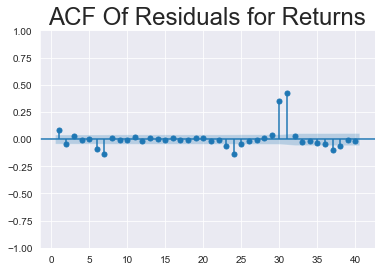

In [155]:
plot_acf(model_residual, zero = False, lags = 40)
plt.title("ACF Of Residuals for Returns",size=24)
plt.show()

#### Residuals must be random

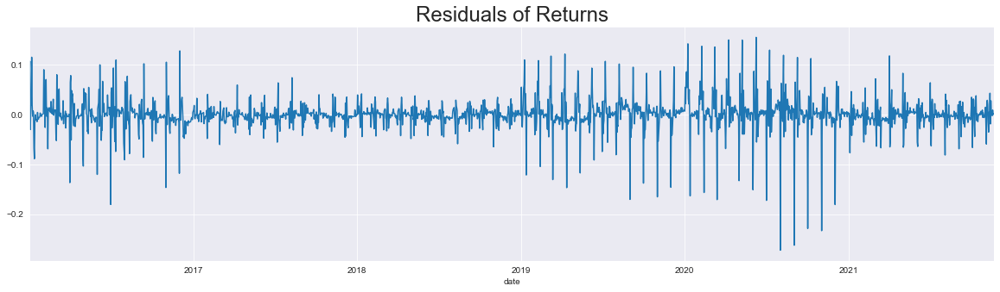

In [156]:
model_residual.plot(figsize=(20,5))
plt.title("Residuals of Returns", size=24)
plt.show()


#### Creating model with differente Transformation Technique

In [157]:
#Compareing the results 

Evaluation = {"Models":pd.Series(["Simple_Exponential","Double_Exponential","Triple_Exp_additive","Triple_Exp_mul_ad","Triple_Exp_ad_mul"\
                                  ,"Triple_Exp_multiplicative","ARIMA","SARIMA"]),\
        "MAPE(%)":pd.Series([mape_ses,mape_dexp,mape_ad_texp,mape_mul_ad_texp,mape_ad_mul_texp,mape_mul_texp,mape_arima,mape_sarima]),\
        "RMSE_Values":pd.Series([test_rmse_ses,test_rmse_dexp,test_rmse_ad_texp,test_rmse_mul_ad_texp,test_rmse_ad_mul_texp,test_rmse_mul_texp,rmse_ARIMA,rmse_SARIMA])}
table_evaluation=pd.DataFrame(Evaluation)
table_evaluation.sort_values(['RMSE_Values'], inplace=True, ignore_index=True)
table_evaluation


,Models,MAPE(%),RMSE_Values
0,SARIMA,1.710000,100.690000
1,Simple_Exponential,2.279408,125.372149
2,Double_Exponential,3.140514,155.917786
3,Triple_Exp_multiplicative,4.878255,256.073784
4,Triple_Exp_mul_ad,5.641933,286.271074
5,Triple_Exp_additive,9.267808,430.734984
6,Triple_Exp_ad_mul,21.647014,1069.786913
7,ARIMA,25.380000,1098.190000


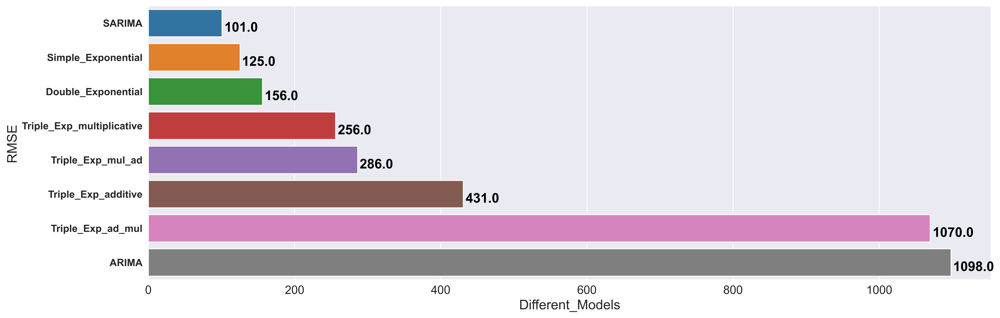

In [158]:
f, axe = plt.subplots(1,1, figsize=(18,6), dpi=500)
sns.barplot(x='RMSE_Values', y='Models', data=table_evaluation, ax = axe)
axe.set_xlabel('Different_Models', size=16)
axe.set_ylabel('RMSE', size=16)
plt.yticks(fontsize=12,fontweight = 'bold')
plt.xticks(fontsize=14)


for i, v in enumerate(np.round(table_evaluation.RMSE_Values.values,0)):
    axe.text(v + 3, i + .25, str(v),
            color = 'black', fontweight = 'bold', fontsize= 16)

plt.show()

#### Observation:
+ **The Sarima and double exponential Model did very well as compared to other Models but Holts-Winter Method did slightly better** 
**Note:Sarima with Hyperparameter tuning may get better results**
+ **Even in methods such as Triple Exponential Smoothing (Holts-Winters Method) taking Seasonality and Trend as Multiplicative gave the best restult in this case**

### Data Pre-processing for Model Driven Techniques

#### Creating Dummy Variables of the Categorical Feature Month of Date Time feature 

In [159]:
df2 = df1.copy()
df2.reset_index(inplace=True)
df2['t'] = np.arange(1,len(df2)+1)
df2['t_squared'] = np.square(df2.t)
df2["month"] = df2.date.dt.strftime("%b") # month extraction
df2["year"] = df2.date.dt.strftime("%Y") # year extraction
months = pd.get_dummies(df2['month'])
months = months[['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug','Sep','Oct','Nov','Dec']]
df2 = pd.concat([df2,months],axis=1)
df2['log_price'] = np.log(df2['price'])
df2

,date,price,t,t_squared,month,year,Jan,Feb,Mar,Apr,May,Jun,Jul,Aug,Sep,Oct,Nov,Dec,log_price
0,2016-01-01,2252.60,1,1,Jan,2016,1,0,0,0,0,0,0,0,0,0,0,0,7.719840
1,2016-01-02,2454.50,2,4,Jan,2016,1,0,0,0,0,0,0,0,0,0,0,0,7.805678
2,2016-01-03,2708.10,3,9,Jan,2016,1,0,0,0,0,0,0,0,0,0,0,0,7.904003
3,2016-01-04,2577.80,4,16,Jan,2016,1,0,0,0,0,0,0,0,0,0,0,0,7.854692
4,2016-01-05,2597.75,5,25,Jan,2016,1,0,0,0,0,0,0,0,0,0,0,0,7.862401
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2177,2021-12-17,4394.40,2178,4743684,Dec,2021,0,0,0,0,0,0,0,0,0,0,0,1,8.388086
2178,2021-12-18,4389.50,2179,4748041,Dec,2021,0,0,0,0,0,0,0,0,0,0,0,1,8.386971
2179,2021-12-19,4389.50,2180,4752400,Dec,2021,0,0,0,0,0,0,0,0,0,0,0,1,8.386971
2180,2021-12-20,4354.10,2181,4756761,Dec,2021,0,0,0,0,0,0,0,0,0,0,0,1,8.378873


#### Splitting data into Train and Test 

In [160]:
train_data = df2.iloc[:size]
test_data = df2.iloc[size:]

In [161]:
train_data

,date,price,t,t_squared,month,year,Jan,Feb,Mar,Apr,May,Jun,Jul,Aug,Sep,Oct,Nov,Dec,log_price
0,2016-01-01,2252.60,1,1,Jan,2016,1,0,0,0,0,0,0,0,0,0,0,0,7.719840
1,2016-01-02,2454.50,2,4,Jan,2016,1,0,0,0,0,0,0,0,0,0,0,0,7.805678
2,2016-01-03,2708.10,3,9,Jan,2016,1,0,0,0,0,0,0,0,0,0,0,0,7.904003
3,2016-01-04,2577.80,4,16,Jan,2016,1,0,0,0,0,0,0,0,0,0,0,0,7.854692
4,2016-01-05,2597.75,5,25,Jan,2016,1,0,0,0,0,0,0,0,0,0,0,0,7.862401
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2146,2021-11-16,4421.40,2147,4609609,Nov,2021,0,0,0,0,0,0,0,0,0,0,1,0,8.394212
2147,2021-11-17,4443.80,2148,4613904,Nov,2021,0,0,0,0,0,0,0,0,0,0,1,0,8.399265
2148,2021-11-18,4423.30,2149,4618201,Nov,2021,0,0,0,0,0,0,0,0,0,0,1,0,8.394641
2149,2021-11-19,4410.10,2150,4622500,Nov,2021,0,0,0,0,0,0,0,0,0,0,1,0,8.391653


In [162]:
test_data.shape

(31, 19)

### Building Ordinary Square Model (Linear Model)

In [163]:
#Linear Model
import statsmodels.formula.api as smf 

linear_model = smf.ols('price~t',data=train_data).fit()
pred_linear =  pd.Series(linear_model.predict(pd.DataFrame(test_data['t'])))
rmse_linear = np.sqrt(np.mean((np.array(test_data['price'])-np.array(pred_linear))**2))
rmse_linear

101.7800366024142

In [164]:
linear_model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.772
Model:                            OLS   Adj. R-squared:                  0.772
Method:                 Least Squares   F-statistic:                     7295.
Date:                Tue, 27 Sep 2022   Prob (F-statistic):               0.00
Time:                        12:39:33   Log-Likelihood:                -15593.
No. Observations:                2151   AIC:                         3.119e+04
Df Residuals:                    2149   BIC:                         3.120e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   2182.5756     14.695    148.524      0.000    2153.757    2211.394
t              1.0103      0.012     85.409      0.000       0.987       1.033
==============================================================================
Omnibus:                       80.519   Durbin-Watson:                   0.113
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               75.190
Skew:                           0.407   Prob(JB):                     4.71e-17
Kurtosis:                       2.581   Cond. No.                     2.49e+03
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 2.49e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

### Model Evaluation

In [165]:
y_pred=linear_model.predict(test_data)
y_pred.head()

2151    4356.732591
2152    4357.742887
2153    4358.753183
2154    4359.763479
2155    4360.773775
dtype: float64

In [166]:
y_test=test_data.iloc[:,1]
y_test.head()

2151    4404.2
2152    4311.2
2153    4275.0
2154    4273.5
2155    4278.3
Name: price, dtype: float64

In [167]:
res8=y_pred-y_test
res8

2151    -47.467409
2152     46.542887
2153     83.753183
2154     86.263479
2155     82.473775
2156     46.084071
2157     43.894367
2158     44.904663
2159     60.914959
2160     88.825255
2161     13.635551
2162    129.745847
2163    351.756143
2164    199.466439
2165     65.376735
2166    -41.712969
2167     53.497327
2168    192.407623
2169    155.517919
2170    111.228215
2171    -71.961489
2172     44.448807
2173     27.559103
2174     51.769399
2175     32.279695
2176    -17.810009
2177    -11.399713
2178     -5.489417
2179     -4.479121
2180     31.931175
2181     40.541470
dtype: float64

<AxesSubplot:ylabel='Frequency'>

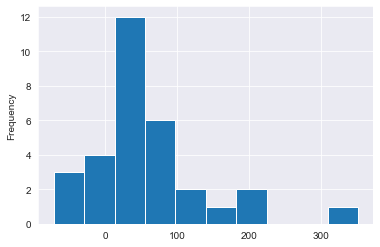

In [168]:
res8.plot(kind='hist')

<AxesSubplot:ylabel='Density'>

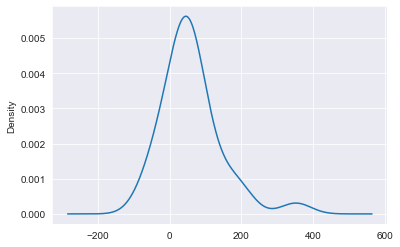

In [169]:
res8.plot(kind='kde')

In [170]:
res8.describe()

count     31.000000
mean      60.790257
std       82.980989
min      -71.961489
25%       20.597327
50%       46.084071
75%       85.008331
max      351.756143
dtype: float64

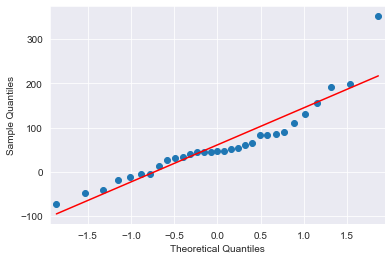

In [171]:
import statsmodels.api as smf
smf.qqplot(res8,line='r')
plt.show()

In [172]:
#Exponential
import statsmodels.formula.api as smf 
Exp = smf.ols('log_price~t',data=train_data).fit()
pred_Exp = pd.Series(Exp.predict(pd.DataFrame(test_data['t'])))
rmse_Exp = np.sqrt(np.mean((np.array(test_data['price'])-np.array(np.exp(pred_Exp)))**2))
rmse_Exp

142.0753980365939

In [173]:
Exp.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              log_price   R-squared:                       0.794
Model:                            OLS   Adj. R-squared:                  0.794
Method:                 Least Squares   F-statistic:                     8294.
Date:                Tue, 27 Sep 2022   Prob (F-statistic):               0.00
Time:                        12:39:37   Log-Likelihood:                 2026.7
No. Observations:                2151   AIC:                            -4049.
Df Residuals:                    2149   BIC:                            -4038.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      7.7490      0.004   1903.790      0.000       7.741       7.757
t              0.0003   3.28e-06     91.073      0.000       0.000       0.000
==============================================================================
Omnibus:                      111.263   Durbin-Watson:                   0.116
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               77.231
Skew:                           0.354   Prob(JB):                     1.70e-17
Kurtosis:                       2.399   Cond. No.                     2.49e+03
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 2.49e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [174]:
#Quadratic 

Quad = smf.ols('price~t+t_squared',data=train_data).fit()
pred_Quad = pd.Series(Quad.predict(test_data[["t","t_squared"]]))
rmse_Quad = np.sqrt(np.mean((np.array(test_data['price'])-np.array(pred_Quad))**2))
rmse_Quad

531.7687455675327

In [175]:
Quad.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.850
Model:                            OLS   Adj. R-squared:                  0.850
Method:                 Least Squares   F-statistic:                     6102.
Date:                Tue, 27 Sep 2022   Prob (F-statistic):               0.00
Time:                        12:39:38   Log-Likelihood:                -15143.
No. Observations:                2151   AIC:                         3.029e+04
Df Residuals:                    2148   BIC:                         3.031e+04
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   2628.6553     17.891    146.928      0.000    2593.570    2663.740
t             -0.2328      0.038     -6.064      0.000      -0.308      -0.158
t_squared      0.0006   1.73e-05     33.436      0.000       0.001       0.001
==============================================================================
Omnibus:                      374.909   Durbin-Watson:                   0.171
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              719.726
Skew:                           1.055   Prob(JB):                    5.17e-157
Kurtosis:                       4.891   Cond. No.                     6.22e+06
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 6.22e+06. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

### Model Evaluation

In [176]:
y_pred=Exp.predict(test_data)
y_pred.head()

2151    8.391164
2152    8.391462
2153    8.391761
2154    8.392059
2155    8.392358
dtype: float64

In [177]:
y_test=test_data.iloc[:,-1]
y_test.head()

2151    8.390314
2152    8.368972
2153    8.360539
2154    8.360188
2155    8.361311
Name: log_price, dtype: float64

In [178]:
res9=y_pred-y_test
res9

2151    0.000850
2152    0.022491
2153    0.031221
2154    0.031871
2155    0.031047
2156    0.022641
2157    0.022198
2158    0.022497
2159    0.026274
2160    0.032842
2161    0.015481
2162    0.042576
2163    0.096429
2164    0.059276
2165    0.027693
2166    0.003194
2167    0.025067
2168    0.057811
2169    0.049087
2170    0.038706
2171   -0.003280
2172    0.023299
2173    0.019476
2174    0.025120
2175    0.020693
2176    0.009309
2177    0.010836
2178    0.012250
2179    0.012548
2180    0.020944
2181    0.022990
dtype: float64

<AxesSubplot:ylabel='Frequency'>

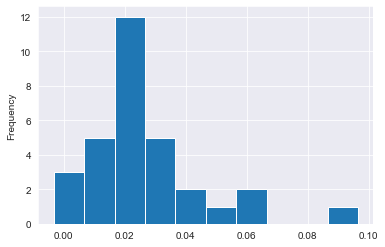

In [179]:
res9.plot(kind='hist')

<AxesSubplot:ylabel='Density'>

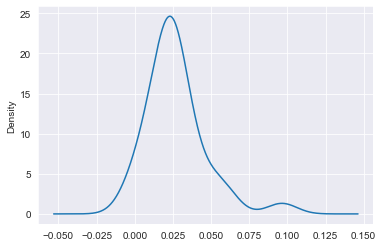

In [180]:
res9.plot(kind='kde')

In [181]:
res9.describe()

count    31.000000
mean      0.026885
std       0.019429
min      -0.003280
25%       0.017479
50%       0.022990
75%       0.031546
max       0.096429
dtype: float64

In [182]:
import statsmodels.api as sms

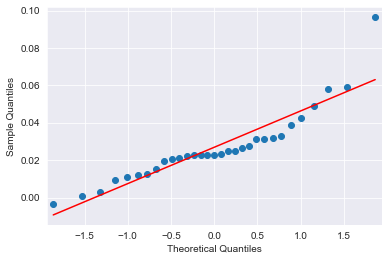

In [183]:
res9=np.array(res9)
sms.qqplot(res9,line='r')
plt.show()

In [184]:
#Additive seasonality 

add_sea = smf.ols('price~Jan+Feb+Mar+Apr+May+Jun+Jul+Aug+Sep+Oct+Nov+Dec',data=train_data).fit()
pred_add_sea = pd.Series(add_sea.predict(test_data[['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug','Sep','Oct','Nov','Dec']]))
rmse_add_sea = np.sqrt(np.mean((np.array(test_data['price'])-np.array(pred_add_sea))**2))
rmse_add_sea

1140.5432353822662

In [185]:
add_sea.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.012
Model:                            OLS   Adj. R-squared:                  0.007
Method:                 Least Squares   F-statistic:                     2.400
Date:                Tue, 27 Sep 2022   Prob (F-statistic):            0.00588
Time:                        12:39:52   Log-Likelihood:                -17172.
No. Observations:                2151   AIC:                         3.437e+04
Df Residuals:                    2139   BIC:                         3.444e+04
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   3016.2513     14.180    212.716      0.000    2988.444    3044.059
Jan          149.5450     50.034      2.989      0.003      51.425     247.665
Feb          198.5801     52.155      3.808      0.000      96.301     300.859
Mar          162.1737     50.034      3.241      0.001      64.053     260.294
Apr          237.6145     50.795      4.678      0.000     138.001     337.228
May          254.1594     50.034      5.080      0.000     156.039     352.280
Jun          274.9262     50.795      5.412      0.000     175.313     374.539
Jul          310.0137     50.034      6.196      0.000     211.893     408.134
Aug          361.3161     50.034      7.221      0.000     263.196     459.437
Sep          343.3226     50.795      6.759      0.000     243.709     442.936
Oct          350.2890     50.034      7.001      0.000     252.169     448.409
Nov          264.1819     52.155      5.065      0.000     161.903     366.461
Dec          110.1292     54.441      2.023      0.043       3.365     216.893
==============================================================================
Omnibus:                     1700.058   Durbin-Watson:                   0.026
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              284.289
Skew:                           0.664   Prob(JB):                     1.85e-62
Kurtosis:                       1.812   Cond. No.                     3.04e+15
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The smallest eigenvalue is 2.52e-28. This might indicate that there are
strong multicollinearity problems or that the design matrix is singular.
"""

In [186]:
#Additive Seasonality Quadratic 

add_sea_Quad = smf.ols('price~t+t_squared+Jan+Feb+Mar+Apr+May+Jun+Jul+Aug+Sep+Oct+Nov+Dec',data=train_data).fit()
pred_add_sea_quad = pd.Series(add_sea_Quad.predict(test_data[['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug','Sep','Oct','Nov','Dec','t','t_squared']]))
rmse_add_sea_quad = np.sqrt(np.mean((np.array(test_data['price'])-np.array(pred_add_sea_quad))**2))
rmse_add_sea_quad

450.5608796076125

In [187]:
add_sea_Quad.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.854
Model:                            OLS   Adj. R-squared:                  0.853
Method:                 Least Squares   F-statistic:                     961.5
Date:                Tue, 27 Sep 2022   Prob (F-statistic):               0.00
Time:                        12:39:53   Log-Likelihood:                -15116.
No. Observations:                2151   AIC:                         3.026e+04
Df Residuals:                    2137   BIC:                         3.034e+04
Df Model:                          13                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   2414.3324     16.489    146.424      0.000    2381.997    2446.668
t             -0.2107      0.038     -5.509      0.000      -0.286      -0.136
t_squared      0.0006   1.72e-05     33.145      0.000       0.001       0.001
Jan          233.0495     19.263     12.098      0.000     195.274     270.825
Feb          257.1482     20.074     12.810      0.000     217.781     296.515
Mar          193.3789     19.262     10.040      0.000     155.605     231.153
Apr          240.3413     19.559     12.288      0.000     201.985     278.698
May          227.3416     19.275     11.795      0.000     189.543     265.141
Jun          217.5092     19.578     11.110      0.000     179.116     255.903
Jul          220.9315     19.300     11.447      0.000     183.084     258.779
Aug          238.9660     19.317     12.371      0.000     201.084     276.848
Sep          187.1748     19.628      9.536      0.000     148.682     225.668
Oct          159.2776     19.361      8.227      0.000     121.309     197.246
Nov          117.6779     20.180      5.831      0.000      78.104     157.252
Dec          121.5358     21.176      5.739      0.000      80.007     163.064
==============================================================================
Omnibus:                      363.446   Durbin-Watson:                   0.174
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              653.597
Skew:                           1.058   Prob(JB):                    1.18e-142
Kurtosis:                       4.677   Cond. No.                     2.61e+22
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The smallest eigenvalue is 1.35e-29. This might indicate that there are
strong multicollinearity problems or that the design matrix is singular.
"""

## Model Evaluation

In [188]:
y_pred=add_sea_Quad.predict(test_data)
y_pred.head()

2151    4717.987799
2152    4720.230630
2153    4722.474600
2154    4724.719710
2155    4726.965960
dtype: float64

In [189]:
y_test=test_data.iloc[:,1]
y_test.head()

2151    4404.2
2152    4311.2
2153    4275.0
2154    4273.5
2155    4278.3
Name: price, dtype: float64

In [190]:
res10=y_test-y_pred
res10

2151   -313.787799
2152   -409.030630
2153   -447.474600
2154   -451.219710
2155   -448.665960
2156   -413.513349
2157   -412.561879
2158   -414.811548
2159   -432.062357
2160   -461.214306
2161   -391.125315
2162   -508.479543
2163   -731.734912
2164   -580.691420
2165   -447.849069
2166   -342.007857
2167   -438.467785
2168   -578.628852
2169   -542.991060
2170   -499.954407
2171   -318.018895
2172   -435.684522
2173   -420.051289
2174   -445.519196
2175   -427.288242
2176   -378.458429
2177   -386.129755
2178   -393.302221
2179   -395.575827
2180   -433.250573
2181   -443.126459
dtype: float64

<AxesSubplot:ylabel='Frequency'>

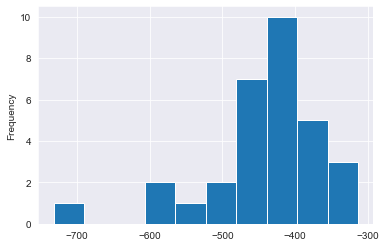

In [191]:
res10.plot(kind='hist')

<AxesSubplot:ylabel='Density'>

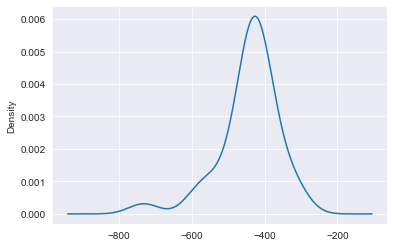

In [192]:
res10.plot(kind='kde')

In [193]:
res10.describe()

count     31.000000
mean    -443.312186
std       81.825377
min     -731.734912
25%     -449.942835
50%     -433.250573
75%     -402.303229
max     -313.787799
dtype: float64

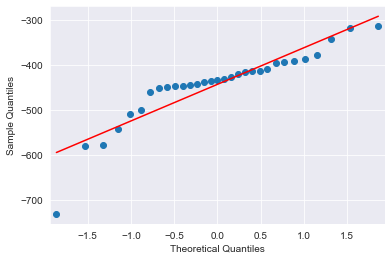

In [194]:
res10=np.array(res10)
sms.qqplot(res10,line='r')
plt.show()

In [195]:
##Multiplicative Seasonality

Mul_sea = smf.ols('log_price~Jan+Feb+Mar+Apr+May+Jun+Jul+Aug+Sep+Oct+Nov+Dec',data = train_data).fit()
pred_Mult_sea = pd.Series(Mul_sea.predict(test_data))
rmse_Mult_sea = np.sqrt(np.mean((np.array(test_data['price'])-np.array(np.exp(pred_Mult_sea)))**2))
rmse_Mult_sea

1207.7059827914065

In [196]:
Mul_sea.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              log_price   R-squared:                       0.012
Model:                            OLS   Adj. R-squared:                  0.007
Method:                 Least Squares   F-statistic:                     2.421
Date:                Tue, 27 Sep 2022   Prob (F-statistic):            0.00543
Time:                        12:40:04   Log-Likelihood:                 339.69
No. Observations:                2151   AIC:                            -655.4
Df Residuals:                    2139   BIC:                            -587.3
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      7.4488      0.004   1803.604      0.000       7.441       7.457
Jan            0.5893      0.015     40.439      0.000       0.561       0.618
Feb            0.6083      0.015     40.047      0.000       0.579       0.638
Mar            0.5970      0.015     40.965      0.000       0.568       0.626
Apr            0.6165      0.015     41.671      0.000       0.587       0.646
May            0.6202      0.015     42.555      0.000       0.592       0.649
Jun            0.6281      0.015     42.454      0.000       0.599       0.657
Jul            0.6363      0.015     43.666      0.000       0.608       0.665
Aug            0.6515      0.015     44.709      0.000       0.623       0.680
Sep            0.6491      0.015     43.876      0.000       0.620       0.678
Oct            0.6502      0.015     44.619      0.000       0.622       0.679
Nov            0.6244      0.015     41.103      0.000       0.595       0.654
Dec            0.5778      0.016     36.442      0.000       0.547       0.609
==============================================================================
Omnibus:                     7345.628   Durbin-Watson:                   0.024
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              264.309
Skew:                           0.556   Prob(JB):                     4.04e-58
Kurtosis:                       1.692   Cond. No.                     3.04e+15
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The smallest eigenvalue is 2.52e-28. This might indicate that there are
strong multicollinearity problems or that the design matrix is singular.
"""

In [197]:
#Multiplicative Additive Seasonality 

Mul_Add_sea = smf.ols('log_price~t+Jan+Feb+Mar+Apr+May+Jun+Jul+Aug+Sep+Oct+Nov+Dec',data = train_data).fit()
pred_Mult_add_sea = pd.Series(Mul_Add_sea.predict(test_data))
rmse_Mult_add_sea = np.sqrt(np.mean((np.array(test_data['price'])-np.array(np.exp(pred_Mult_add_sea)))**2))
rmse_Mult_add_sea 

97.0283993006051

In [198]:
Mul_Add_sea.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              log_price   R-squared:                       0.801
Model:                            OLS   Adj. R-squared:                  0.800
Method:                 Least Squares   F-statistic:                     717.6
Date:                Tue, 27 Sep 2022   Prob (F-statistic):               0.00
Time:                        12:40:05   Log-Likelihood:                 2063.3
No. Observations:                2151   AIC:                            -4101.
Df Residuals:                    2138   BIC:                            -4027.
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      7.1505      0.004   1915.899      0.000       7.143       7.158
t              0.0003   3.26e-06     92.081      0.000       0.000       0.000
Jan            0.6085      0.007     92.976      0.000       0.596       0.621
Feb            0.6192      0.007     90.803      0.000       0.606       0.633
Mar            0.5983      0.007     91.470      0.000       0.585       0.611
Apr            0.6087      0.007     91.653      0.000       0.596       0.622
May            0.6032      0.007     92.177      0.000       0.590       0.616
Jun            0.6020      0.007     90.565      0.000       0.589       0.615
Jul            0.6010      0.007     91.731      0.000       0.588       0.614
Aug            0.6069      0.007     92.535      0.000       0.594       0.620
Sep            0.5954      0.007     89.310      0.000       0.582       0.608
Oct            0.5873      0.007     89.301      0.000       0.574       0.600
Nov            0.5686      0.007     83.066      0.000       0.555       0.582
Dec            0.5514      0.007     77.417      0.000       0.537       0.565
==============================================================================
Omnibus:                      119.822   Durbin-Watson:                   0.118
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               81.985
Skew:                           0.365   Prob(JB):                     1.57e-18
Kurtosis:                       2.382   Cond. No.                     1.45e+19
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The smallest eigenvalue is 1.57e-29. This might indicate that there are
strong multicollinearity problems or that the design matrix is singular.
"""

In [199]:
np.exp(pred_Mult_add_sea)

2151    4295.437820
2152    4296.727875
2153    4298.018317
2154    4299.309147
2155    4300.600365
2156    4301.891970
2157    4303.183963
2158    4304.476344
2159    4305.769114
2160    4307.062271
2161    4235.070235
2162    4236.342159
2163    4237.614466
2164    4238.887154
2165    4240.160225
2166    4241.433678
2167    4242.707514
2168    4243.981732
2169    4245.256333
2170    4246.531317
2171    4247.806684
2172    4249.082433
2173    4250.358566
2174    4251.635082
2175    4252.911982
2176    4254.189265
2177    4255.466931
2178    4256.744982
2179    4258.023416
2180    4259.302234
2181    4260.581436
dtype: float64

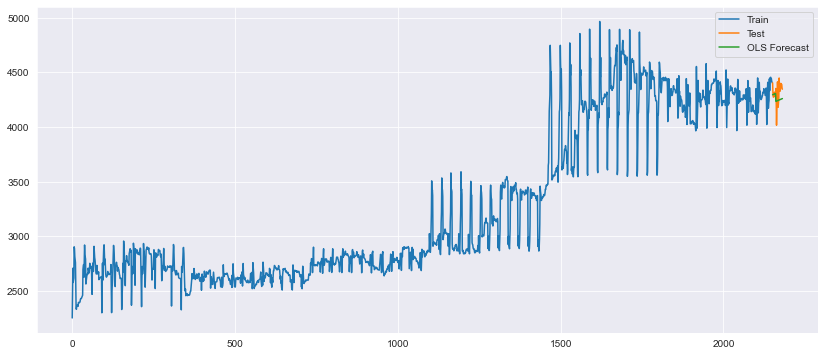

In [200]:
plt.figure(figsize=(14,6))
plt.plot(train_data['price'], label='Train')
plt.plot(test_data['price'], label='Test')
plt.plot(np.exp(pred_Mult_add_sea), label='OLS Forecast')
plt.legend(loc='best')
plt.show()

In [201]:
#Compare the results 

data = {"Models":pd.Series(["rmse_linear","rmse_Exp","rmse_Quad","rmse_add_sea","rmse_add_sea_quad","rmse_Mult_sea","rmse_Mult_add_sea"]),"RMSE_Values":pd.Series([rmse_linear,rmse_Exp,rmse_Quad,rmse_add_sea,rmse_add_sea_quad,rmse_Mult_sea,rmse_Mult_add_sea])}
table_rmse=pd.DataFrame(data)
table_rmse.sort_values(['RMSE_Values'], inplace=True, ignore_index=True)

In [202]:
e = table_rmse.append(table_evaluation)
e.drop('MAPE(%)', axis=1, inplace=True)
e.sort_values(['RMSE_Values'], inplace=True, ignore_index=True)


In [203]:
e

,Models,RMSE_Values
0,rmse_Mult_add_sea,97.028399
1,SARIMA,100.690000
2,rmse_linear,101.780037
3,Simple_Exponential,125.372149
4,rmse_Exp,142.075398
5,Double_Exponential,155.917786
6,Triple_Exp_multiplicative,256.073784
7,Triple_Exp_mul_ad,286.271074
8,Triple_Exp_additive,430.734984
9,rmse_add_sea_quad,450.560880


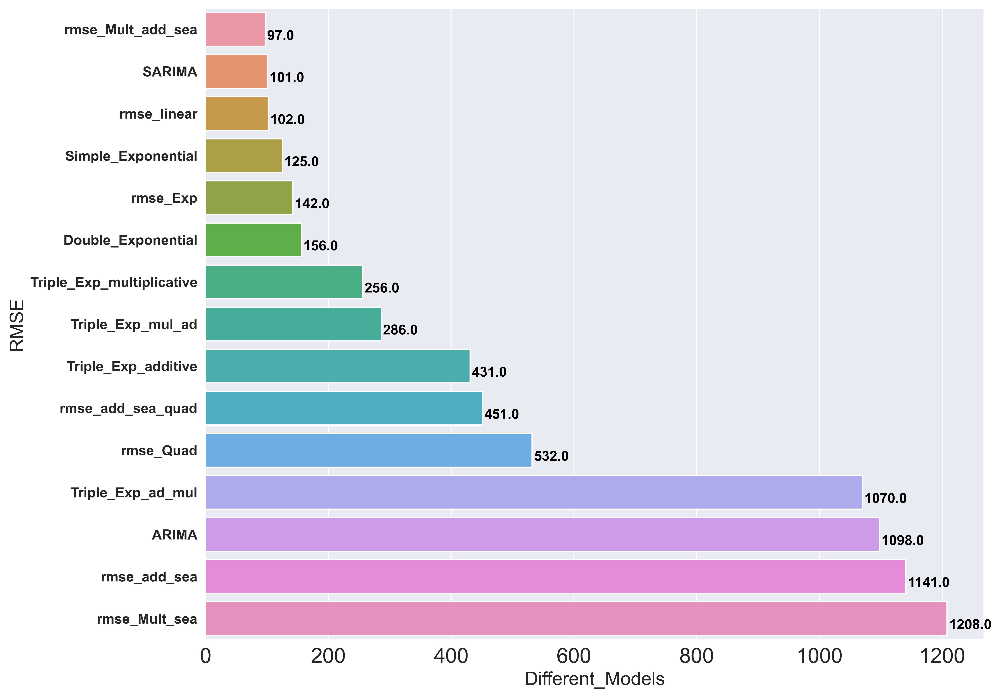

In [204]:
f, axe = plt.subplots(1,1, figsize=(12,10), dpi=500)
sns.barplot(x='RMSE_Values', y='Models', data=e, ax = axe)
axe.set_xlabel('Different_Models', size=16)
axe.set_ylabel('RMSE', size=16)
plt.yticks(fontsize=12,fontweight = 'bold')
plt.xticks(fontsize=18)

for i, v in enumerate(np.round(e.RMSE_Values.values,0)):
    axe.text(v + 3, i + .25, str(v),
            color = 'black', fontweight = 'bold', fontsize= 12)

plt.show()

# Conclusion:
## <p style="color:Green;font-size:18;">Double exponetial and Sarima</p><p style="color:red;font-size:14px;">The best model we have got so far with the lowest RMSE and lowest MAPE.</p>    

In [212]:
from prophet import Prophet

In [205]:
df_prophet = pd.read_csv('Gold_data.csv')

In [206]:
df_prophet['date'] = pd.DatetimeIndex(df['date'])
df_prophet.dtypes

date     datetime64[ns]
price           float64
dtype: object

In [207]:
df_prophet.shape

(2182, 2)

In [210]:
size=-31
df_train=df_prophet.iloc[0:size,]
df_test=df_prophet.iloc[size:,]

In [211]:
df2 = df_train.rename(columns={'date': 'ds',
                        'price': 'y'})

df2.head()

,ds,y
0,2016-01-01,2252.60
1,2016-01-02,2454.50
2,2016-01-03,2708.10
3,2016-01-04,2577.80
4,2016-01-05,2597.75


In [213]:
# set the uncertainty interval to 95% (the Prophet default is 80%)
my_model = Prophet(interval_width=0.95)
my_model.fit(df2)

Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


In [214]:
future_dates = my_model.make_future_dataframe(periods=30, freq='D')
future_dates.tail(30)

,ds
2151,2021-11-21
2152,2021-11-22
2153,2021-11-23
2154,2021-11-24
2155,2021-11-25
2156,2021-11-26
2157,2021-11-27
2158,2021-11-28
2159,2021-11-29
2160,2021-11-30


In [215]:
forecast=my_model.predict(future_dates)
forecast.tail(30)

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
2151,2021-11-21,4217.875003,3859.499821,4505.780726,4217.875003,4217.875003,-40.918935,-40.918935,-40.918935,-2.280064,-2.280064,-2.280064,-38.638871,-38.638871,-38.638871,0.0,0.0,0.0,4176.956069
2152,2021-11-22,4217.517061,3854.801722,4530.438131,4217.517061,4217.517061,-44.109310,-44.109310,-44.109310,-0.614158,-0.614158,-0.614158,-43.495152,-43.495152,-43.495152,0.0,0.0,0.0,4173.407751
2153,2021-11-23,4217.159118,3835.417036,4501.183982,4217.159118,4217.159118,-47.933218,-47.933218,-47.933218,1.019538,1.019538,1.019538,-48.952757,-48.952757,-48.952757,0.0,0.0,0.0,4169.225900
2154,2021-11-24,4216.801176,3828.782273,4497.644812,4216.801176,4216.801176,-53.649352,-53.649352,-53.649352,1.326471,1.326471,1.326471,-54.975823,-54.975823,-54.975823,0.0,0.0,0.0,4163.151824
2155,2021-11-25,4216.443233,3815.515532,4490.777208,4216.366836,4216.443233,-59.319703,-59.319703,-59.319703,2.191346,2.191346,2.191346,-61.511049,-61.511049,-61.511049,0.0,0.0,0.0,4157.123530
2156,2021-11-26,4216.085291,3847.452757,4481.151566,4215.842155,4216.198553,-71.229948,-71.229948,-71.229948,-2.741797,-2.741797,-2.741797,-68.488151,-68.488151,-68.488151,0.0,0.0,0.0,4144.855343
2157,2021-11-27,4215.727348,3812.374953,4470.895460,4215.203360,4215.892019,-74.722107,-74.722107,-74.722107,1.098664,1.098664,1.098664,-75.820771,-75.820771,-75.820771,0.0,0.0,0.0,4141.005241
2158,2021-11-28,4215.369405,3816.399722,4434.453167,4214.536561,4215.674355,-85.687897,-85.687897,-85.687897,-2.280064,-2.280064,-2.280064,-83.407833,-83.407833,-83.407833,0.0,0.0,0.0,4129.681509
2159,2021-11-29,4215.011463,3790.319245,4445.943703,4213.928935,4215.496350,-91.749463,-91.749463,-91.749463,-0.614158,-0.614158,-0.614158,-91.135305,-91.135305,-91.135305,0.0,0.0,0.0,4123.262000
2160,2021-11-30,4214.653520,3779.084922,4442.031379,4213.118670,4215.501877,-97.858817,-97.858817,-97.858817,1.019538,1.019538,1.019538,-98.878356,-98.878356,-98.878356,0.0,0.0,0.0,4116.794703


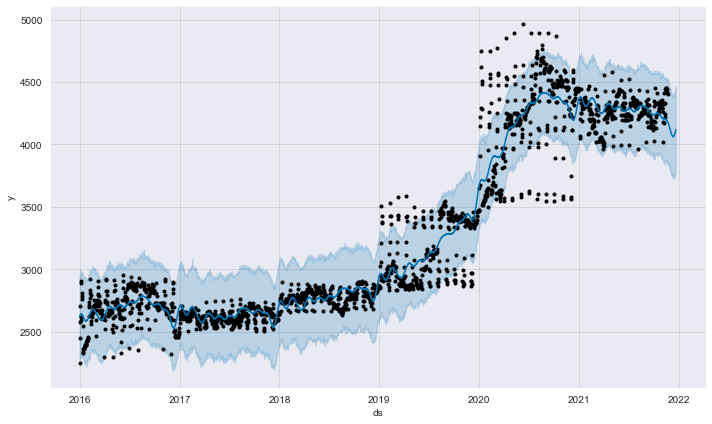

In [216]:
fig=my_model.plot(forecast, uncertainty=True)
fig.show()

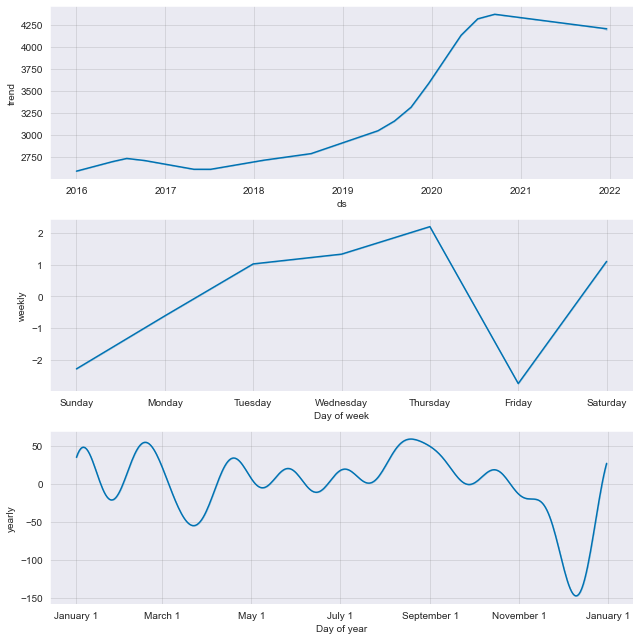

In [217]:
## Decomposition
fig1=my_model.plot_components(forecast)
fig1.show()

In [218]:
forecast_for_30days=forecast[['ds','yhat']][-30:]
forecast_for_30days.set_index('ds',inplace=True)
forecast_for_30days

,yhat
ds,
2021-11-21,4176.956069
2021-11-22,4173.407751
2021-11-23,4169.225900
2021-11-24,4163.151824
2021-11-25,4157.123530
2021-11-26,4144.855343
2021-11-27,4141.005241
2021-11-28,4129.681509
2021-11-29,4123.262000


## Model Evaluation

In [219]:
y_pred=forecast[['yhat']]
y_pred.tail(30)

,yhat
2151,4176.956069
2152,4173.407751
2153,4169.225900
2154,4163.151824
2155,4157.123530
2156,4144.855343
2157,4141.005241
2158,4129.681509
2159,4123.262000
2160,4116.794703


In [233]:
y_actual=df_test[['price']].tail(31)
y_actual

,price
2151,4404.2
2152,4311.2
2153,4275.0
2154,4273.5
2155,4278.3
2156,4315.7
2157,4318.9
2158,4318.9
2159,4303.9
2160,4277.0


In [262]:
dd2=y_actual.join(y_pred)
dd2

,price,yhat
2151,4404.2,4176.956069
2152,4311.2,4173.407751
2153,4275.0,4169.225900
2154,4273.5,4163.151824
2155,4278.3,4157.123530
2156,4315.7,4144.855343
2157,4318.9,4141.005241
2158,4318.9,4129.681509
2159,4303.9,4123.262000
2160,4277.0,4116.794703


In [263]:
dd2.dropna(axis=0,inplace=True)
dd2

,price,yhat
2151,4404.2,4176.956069
2152,4311.2,4173.407751
2153,4275.0,4169.225900
2154,4273.5,4163.151824
2155,4278.3,4157.123530
2156,4315.7,4144.855343
2157,4318.9,4141.005241
2158,4318.9,4129.681509
2159,4303.9,4123.262000
2160,4277.0,4116.794703


In [264]:
dd2['residuals']=dd2['price']-dd2['yhat']
dd2

,price,yhat,residuals
2151,4404.2,4176.956069,227.243931
2152,4311.2,4173.407751,137.792249
2153,4275.0,4169.225900,105.774100
2154,4273.5,4163.151824,110.348176
2155,4278.3,4157.123530,121.176470
2156,4315.7,4144.855343,170.844657
2157,4318.9,4141.005241,177.894759
2158,4318.9,4129.681509,189.218491
2159,4303.9,4123.262000,180.638000
2160,4277.0,4116.794703,160.205297


In [275]:
## Mean square error
res=dd2['residuals'].mean()
res

204.90044935934483

In [277]:
res2=np.square(res)
mse=res2/(len(dd2['residuals']))
mse

1399.4731382553812

In [278]:
rmse=np.sqrt(mse)
rsme

527.3473363664987

<AxesSubplot:ylabel='Frequency'>

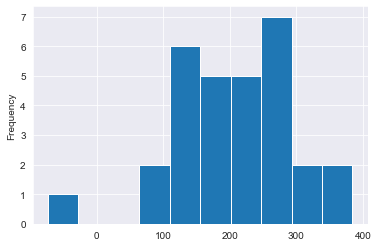

In [279]:
dd2['residuals'].plot(kind='hist')

<AxesSubplot:ylabel='Density'>

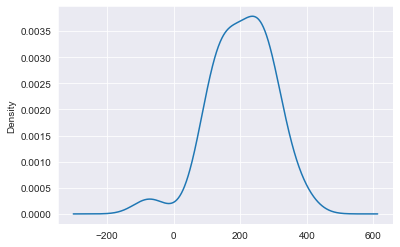

In [280]:
dd2['residuals'].plot(kind='kde')

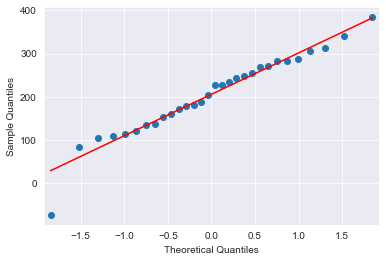

In [282]:
sms.qqplot(dd2['residuals'],line='q')
plt.show()

In [283]:
dd2['residuals'].describe()

count     30.000000
mean     204.900449
std       93.000631
min      -72.893185
25%      141.509866
50%      215.587108
75%      270.423619
max      384.075040
Name: residuals, dtype: float64

### RSME:-527.35
### Q-Q plot=Linear
### Histogram,Densityplot:-Slightly Right Skewd
### Althoug the error is large but the model gives the value between 95% confident  interval and gave in certian range in whichh value can vary so we used FB PROPHET model for the deployment